In [1]:
import wfdb
import os
import glob
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, find_peaks
from sklearn.decomposition import FastICA
from scipy.interpolate import RectBivariateSpline
from scipy import interpolate
from scipy.ndimage import gaussian_filter
from scipy.optimize import curve_fit
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
import matplotlib.animation as animation
import matplotlib.cm as cm
from IPython.display import HTML
# from google.colab import files
from pyclustering.cluster.gmeans import gmeans
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.utils.metric import type_metric, distance_metric
from sklearn.svm import SVC
import itertools
import warnings
np.warnings = warnings

# ここから

In [2]:
# ガウス関数定義
def gaussian_2d(coord, A, x0, y0, sigma_x, sigma_y, theta, offset):
    x, y = coord #coord[:, 0], coord[:, 1]
    a = (np.cos(theta)**2) / (2*sigma_x**2) + (np.sin(theta)**2) / (2*sigma_y**2)
    b = -(np.sin(2*theta)) / (4*sigma_x**2) + (np.sin(2*theta)) / (4*sigma_y**2)
    c = (np.sin(theta)**2) / (2*sigma_x**2) + (np.cos(theta)**2) / (2*sigma_y**2)
    return A * np.exp(-(a*(x - x0)**2 + 2*b*(x - x0)*(y - y0) + c*(y - y0)**2)) + offset

In [3]:
def waveform_length(signal):
    return np.sum(np.abs(np.diff(signal, axis=0)), axis=0)

def ptp(signal):
    return np.ptp(signal, axis=0)

def arv(signal):
    return np.mean(np.abs(signal), axis=0)

def rms(signal):
    return np.sqrt(np.mean(signal**2, axis=0))

def zc(signal):
    s = np.sign(signal)
    s_prev = s[:-1]
    s_next = s[1:]
    sign_change = (s_prev * s_next) < 0
    return np.sum(sign_change, axis=0)

In [4]:
def get_activation_map(emg_data, curve, feature_func, fs=2000, window_ms=200, stride_ms=50, n_interp=10):
    # --- データ読み込み例（ここではダミーデータ） ---
    emg_data = emg_data  # shape: (n_samples, n_channels)
    curve = curve  # 近似曲面
    feature_func = feature_func  # 特徴量抽出関数
    fs = fs  # サンプリング周波数
    window_ms = window_ms    # ウィンドウ幅 [ms]
    stride_ms = stride_ms    # スライド幅 [ms]
    window_size = int(fs * (window_ms / 1000))  # サンプル数に変換
    stride_size = int(fs * stride_ms / 1000)  # スライド数
    n_samples = emg_data.shape[0]
    # 座標グリッド
    x = np.arange(8)
    y = np.arange(8)
    xv, yv = np.meshgrid(x, y)
    coords = np.vstack((xv.ravel(), yv.ravel()))
    # ==== 元の電極座標と補間座標 ====
    x_interp = np.linspace(0, 7, (8 - 1) * n_interp + 1)
    y_interp = np.linspace(0, 7, (8 - 1) * n_interp + 1)
    xv_interp, yv_interp = np.meshgrid(x_interp, y_interp)
    coords_interp = np.vstack((xv_interp.ravel(), yv_interp.ravel()))  # shape: (2, N)

    
    frames = []
    for start in range(0, n_samples - window_size + 1, stride_size):
        end = start + window_size
        window_emg = emg_data[start:end, :] # shape: (window_size, n_channels)
        #特徴量抽出
        feature = feature_func(window_emg) # shape: (n_channels,)
        map_2d = feature.reshape(8, 8)  # 8x8のマップに変形
        f = RectBivariateSpline(x, y, map_2d)
        map_interp = f(x_interp, y_interp)  # 補間
        frames.append(map_interp)
    return frames

In [5]:
record_session1 = wfdb.rdrecord('pr_dataset/subject01_session1/maintenance_preprocess_sample1')
record_session2 = wfdb.rdrecord('pr_dataset/subject01_session2/maintenance_preprocess_sample1')

filtered_emg_ED_session1 = record_session1.p_signal[:,:64] #Extensor Distal
filtered_emg_EP_session1 = record_session1.p_signal[:,64:128] #Extensor Proximal
filtered_emg_FD_session1 = record_session1.p_signal[:,128:192] #Flexor Distal
filtered_emg_FP_session1 = record_session1.p_signal[:,192:256] #Flexor Proximal

filtered_emg_ED_session2 = record_session2.p_signal[:,:64] #Extensor Distal
filtered_emg_EP_session2 = record_session2.p_signal[:,64:128] #Extensor Proximal
filtered_emg_FD_session2 = record_session2.p_signal[:,128:192] #Flexor Distal
filtered_emg_FP_session2 = record_session2.p_signal[:,192:256] #Flexor Proximal

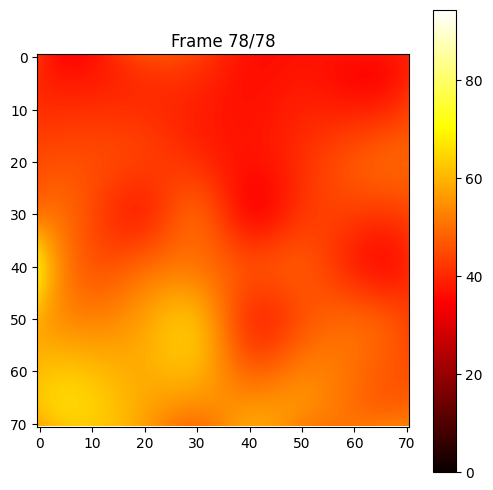

In [6]:
frames = get_activation_map(filtered_emg_ED_session1, gaussian_2d, zc, window_ms=200, stride_ms=50)

fig, ax = plt.subplots(figsize=(6, 6))
img = ax.imshow(frames[0], cmap='hot', interpolation='bilinear', vmin=0, vmax=np.max(frames))
plt.colorbar(img, ax=ax)
ax.set_title('Interpolated MUAP Peak-to-Peak Gaussian Fit')

def update(i):
    img.set_data(frames[i])
    ax.set_title(f'Frame {i+1}/{len(frames)}')
    return [img]

ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=200, blit=True)
HTML(ani.to_jshtml())


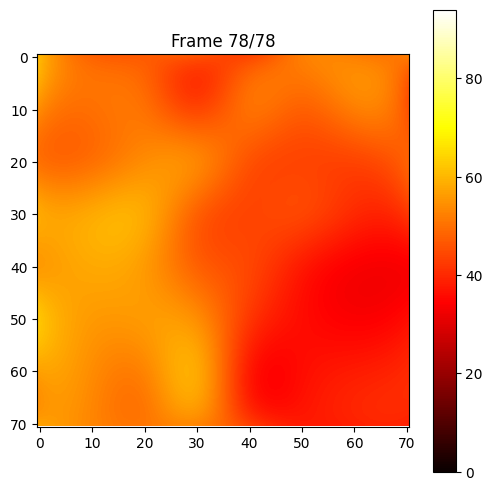

In [7]:
frames = get_activation_map(filtered_emg_ED_session2, gaussian_2d, zc, window_ms=200, stride_ms=50)

fig, ax = plt.subplots(figsize=(6, 6))
img = ax.imshow(frames[0], cmap='hot', interpolation='bilinear', vmin=0, vmax=np.max(frames))
plt.colorbar(img, ax=ax)
ax.set_title('Interpolated MUAP Peak-to-Peak Gaussian Fit')

def update(i):
    img.set_data(frames[i])
    ax.set_title(f'Frame {i+1}/{len(frames)}')
    return [img]

ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=200, blit=True)
HTML(ani.to_jshtml())

In [56]:
def get_centers_directions(emg_data, curve, feature_func, fs=2000, window_ms=200, stride_ms=50):
    # --- データ読み込み例（ここではダミーデータ） ---
    emg_data = emg_data  # shape: (n_samples, n_channels)
    curve = curve  # 近似曲面
    feature_func = feature_func  # 特徴量抽出関数
    fs = fs  # サンプリング周波数
    window_ms = window_ms    # ウィンドウ幅 [ms]
    stride_ms = stride_ms    # スライド幅 [ms]
    window_size = int(fs * (window_ms / 1000))  # サンプル数に変換
    stride_size = int(fs * stride_ms / 1000)  # スライド数
    n_samples = emg_data.shape[0]
    # 座標グリッド
    x = np.arange(8)
    y = np.arange(8)
    xv, yv = np.meshgrid(x, y)
    coords = np.vstack((xv.ravel(), yv.ravel()))

    centers = []
    directions = []
    theta_1s = []
    mucle_activity_information_list = []
    for start in range(0, n_samples - window_size + 1, stride_size):
        end = start + window_size
        window_emg = emg_data[start:end, :]
        #特徴量抽出
        feature = feature_func(window_emg) # shape: (n_channels,)
        map_2d = feature.reshape(8, 8)  # 8x8のマップに変形
        # フィッティング
        max_index = np.unravel_index(np.argmax(map_2d), map_2d.shape)
        initial = [np.max(feature)-np.min(feature), max_index[0], max_index[1], 1, 1, 0, np.min(feature)]
        bounds = ([0, 0, 0, 0.1, 0.1, -np.pi/2, -np.inf],
                [np.inf, 7, 7, 5, 5, np.pi/2, np.inf])
        popt, _ = curve_fit(curve, coords, feature, p0=initial, bounds=bounds, maxfev=10000)
        A, x0, y0, sigma_x, sigma_y, theta, offset = popt #パラメータ取得
        center = (x0, y0)
        if sigma_x > sigma_y:
            theta_1 = theta
            # print('σx > σy')
        else:
            if theta >= 0:
                theta_1 = theta - np.pi/2
            else:
                theta_1 = theta + np.pi/2
            # print('σy >= σx')
        direction = (np.cos(theta_1), np.sin(theta_1))

        centers.append(center)
        directions.append(direction)
        theta_1s.append(np.degrees(theta_1))

        mucle_activity_information = []
        mucle_activity_information.append(center[0])
        mucle_activity_information.append(center[1])
        mucle_activity_information.append(np.degrees(theta_1))
        mucle_activity_information_list.append(mucle_activity_information)

    # print(centers)
    # print(directions)
    # print(theta_1s)
    # print(f'all centers:: ave:{np.mean(centers, axis=0)}, std:{np.std(centers, axis=0)}')
    # print(f'all theta_1:: ave:{np.mean(theta_1s, axis=0)}, std:{np.std(theta_1s, axis=0)}')

    return mucle_activity_information_list

In [32]:
def clustering(features, k1=4, k2=3):
    # 1. 特徴ベクトルを構築
    features = np.array(features)
    results_df = pd.DataFrame(data=features, columns=['center_x', 'center_y', 'theta_deg'])

    # --- 第1段階：中心座標でクラスタリング ---
    # 特徴量：center_x, center_y
    center_features = results_df[['center_x', 'center_y']].dropna()
    k1 = k1  # 中心クラスタ数（例）
    kmeans1 = KMeans(n_clusters=k1, random_state=0)
    center_labels = kmeans1.fit_predict(center_features)

    # 結果に追加
    results_df['center_cluster'] = -1
    results_df.loc[center_features.index, 'center_cluster'] = center_labels

    # # --- 第2段階：方向角でクラスタリング（各中心クラスタ内で） ---
    # # θの周期性を考慮 → sinθ, cosθでクラスタリング
    # results_df['theta_sin'] = np.sin(results_df['theta_rad'])
    # results_df['theta_cos'] = np.cos(results_df['theta_rad'])

    direction_cluster_labels = np.full(len(results_df), -1)  # 初期化

    k2 = k2  # 各中心クラスタ内の方向クラスタ数（例）

    for group_id in range(k1):
        group_df = results_df[results_df['center_cluster'] == group_id]
        idx = group_df.index
        if len(group_df) >= k2:  # クラスタ数以上あるか確認
            dir_features = group_df[['theta_deg']].values
            kmeans2 = KMeans(n_clusters=k2, random_state=0)  # 固定乱数
            sub_labels = kmeans2.fit_predict(dir_features)
            direction_cluster_labels[idx] = sub_labels + group_id * 10  # 固有ラベル化

    # 結果に追加
    results_df['direction_cluster'] = direction_cluster_labels


    # クラスタごとに平均・標準偏差を集計
    cluster_stats = results_df.groupby('direction_cluster').agg({
        'center_x': ['mean', 'std'],
        'center_y': ['mean', 'std'],
        'theta_deg': ['mean', 'std'],
        'direction_cluster': 'count'
    })

    # 結果をまとめ直す
    summary_df = pd.DataFrame({
        'cluster': cluster_stats.index,
        'center_x_mean': cluster_stats[('center_x', 'mean')],
        'center_x_std': cluster_stats[('center_x', 'std')],
        'center_y_mean': cluster_stats[('center_y', 'mean')],
        'center_y_std': cluster_stats[('center_y', 'std')],
        'theta_deg_mean': cluster_stats[('theta_deg', 'mean')],
        'theta_deg_std': cluster_stats[('theta_deg', 'std')],
        # 'count': results_df['cluster'].value_counts().sort_index(),
        'count': cluster_stats[('direction_cluster', 'count')]
    }).reset_index(drop=True)

    # 結果表示
    summary_df

    return results_df, summary_df

In [33]:
def get_cluster_colors(n_clusters, cmap_name='tab20'):
    cmap = cm.get_cmap(cmap_name, n_clusters)  # 'tab20', 'nipy_spectral', etc.
    return [cmap(i) for i in range(n_clusters)]

In [34]:
def plot_fiber(results_df, arrow_scale=0.5):
  arrow_scale = arrow_scale

  n_clusters = results_df['direction_cluster'].nunique()
  cluster_colors = get_cluster_colors(n_clusters)

  # プロット準備
  plt.figure(figsize=(7, 6))
  for n, center_cluster in enumerate(sorted(results_df['direction_cluster'].unique())):
    sub_df = results_df[results_df['direction_cluster'] == center_cluster]
    color = cluster_colors[n]

    for _, row in sub_df.iterrows():
          x, y = row['center_x'], row['center_y']
          theta = row['theta_deg']
          dx, dy = np.cos(np.radians(theta)) * arrow_scale, np.sin(np.radians(theta)) * arrow_scale

          # 色で中心クラスタを、マーカーサイズで方向クラスタを示す
          plt.arrow(x, y, dx, dy, head_width=0.15, color=color, alpha=0.8)
          plt.plot(x, y, 'o', color=color,
                  label=f"Center Cl {center_cluster}" if f"Center Cl {center_cluster}" not in plt.gca().get_legend_handles_labels()[1] else "")

  # ラベル・軸
  plt.xlabel("center_x")
  plt.ylabel("center_y")
  plt.title("2-Stage Clustering of Muscle Fiber Direction")
  plt.grid(True)
  plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
  plt.axis('equal')
  plt.tight_layout()
  plt.xlim(0, 7)
  plt.ylim(0, 7)
  plt.show()

In [35]:
def get_virtual_bipolars(results_df, ied=2, arrow_scale=0.5):
  #仮想双極電極の電極間距離（cm）
  a = ied

#   n_clusters = results_df['direction_cluster'].nunique()
#   cluster_colors = get_cluster_colors(n_clusters)

  virtual_bipolars = []
  labels = []
  center_direction = []
  n_virtual_bipolars_checker = []
  for n, direction_cluster in enumerate(sorted(results_df['direction_cluster'].unique())):
    sub_df = results_df[results_df['direction_cluster'] == direction_cluster]
    if sub_df['center_cluster'].count() >= 20 and sub_df['center_x'].std() < 1 and sub_df['center_y'].std() < 1 and sub_df['theta_deg'].std() < 20:
      x, y = sub_df['center_x'].mean(), sub_df['center_y'].mean()
      theta = sub_df['theta_deg'].mean()
      #dx, dy = np.cos(np.radians(theta)) * arrow_scale, np.sin(np.radians(theta)) * arrow_scale
      # print(f'cluster:{direction_cluster}, x={x}, y={y}, θ={theta}')
      x1 = x - a/2*np.cos(np.radians(theta))
      y1 = y - a/2*np.sin(np.radians(theta))
      x2 = x + a/2*np.cos(np.radians(theta))
      y2 = y + a/2*np.sin(np.radians(theta))
      virtual_bipolars.append([x1, y1, x2, y2])
      labels.append(direction_cluster)
      center_direction.append([x, y, theta])
      n_virtual_bipolars_checker.append(True)
  # if len(n_virtual_bipolars_checker) == 1:
  #   virtual_bipolars.append([0,0,0,0])
  #   labels.append(999)
  #   center_direction.append([0,0,0])

  return virtual_bipolars, labels, center_direction, len(n_virtual_bipolars_checker)

In [36]:
def extract_rms_features(windows):
    """
    各ウィンドウからチャネルごとのRMS特徴量を抽出
    入力: shape = (window_size, n_channels)
    出力: shape = (n_channels)
    """
    return np.sqrt(np.mean(np.square(windows), axis=0))

In [37]:
def get_virtual_emg(emg_data, virtual_bipolars):
  # --- データ読み込み ---
  emg_data = emg_data

  # === スライディングウィンドウ抽出 ===
  n_samples = emg_data.shape[0]
  segments = []
  time_stamps = []

  # 座標グリッド
  x = np.arange(8)
  y = np.arange(8)
  xv, yv = np.meshgrid(x, y)
  coords = np.vstack((xv.ravel(), yv.ravel()))
  # # パラメータ計算
  # f = RectBivariateSpline(x, y, map_2d)

  virtual_emg = []
  for i in range(n_samples):
    f = RectBivariateSpline(x, y, emg_data[i].reshape(8,8))
    z_list = []
    for bipolar in virtual_bipolars:
      x1=bipolar[0]
      y1=bipolar[1]
      x2=bipolar[2]
      y2=bipolar[3]
      z1 = f(x1, y1)
      z2 = f(x2, y2)
      z_diff = z1 - z2
      z_list.append(z_diff)
    virtual_emg.append(np.array(z_list).reshape(-1))
  virtual_emg = np.array(virtual_emg)

  # print(emg_data.shape)
  # print(virtual_emg.shape)

  return virtual_emg

In [38]:
def get_features(virtual_emg, labels, fs=2000, window_ms=50, stride_ms=20):
  # --- データ読み込み例（ここではダミーデータ） ---
  fs = fs  # サンプリング周波数
  window_ms = window_ms    # ウィンドウ幅 [ms]
  stride_ms = stride_ms    # スライド幅 [ms]
  window_size = int(fs * (window_ms / 1000))  # サンプル数に変換
  stride_size = int(fs * stride_ms / 1000)  # スライド数
  n_samples = virtual_emg.shape[0]
  X = []
  y = []
  for start in range(0, n_samples - window_size + 1, stride_size):
      end = start + window_size
      window_emg = virtual_emg[start:end, :]
      #特徴量抽出
      rms = extract_rms_features(window_emg) # shape: (virtual_bipolar_channels,)
      X.append(rms)
      y.append(labels)
  return X, y

In [39]:
#分類器
def SVC_classifier(X_session1, y_session1, X_session2, y_session2):

    X_train = np.array(X_session1).reshape(-1,1)
    y_train = np.array(y_session1).reshape(-1,1)
    X_test = np.array(X_session2).reshape(-1,1)
    y_test = np.array(y_session2).reshape(-1,1)

    # データ分割
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # SVMモデル学習
    model = SVC(kernel='rbf', probability=True, random_state=0)
    model.fit(X_train, y_train)

    prob_matrix = model.predict_proba(X_test) # shape: (n_test_samples, n_train_classes)
    # === 各テストラベルごとに学習クラスへの平均確率を出力 ===
    class_labels = model.classes_  # 学習クラス（例: [0, 1, 2]）

    result = []

    for test_label in np.unique(y_test):
        idx = y_test.reshape(-1) == test_label
        mean_prob = np.mean(prob_matrix[idx], axis=0)  # 学習クラスへの平均確率
        result.append([test_label] + list(mean_prob))

    # # === 表形式で表示 ===
    # columns = ['Test Label'] + [f"P(Train={cls})" for cls in class_labels]
    # df_result = pd.DataFrame(result, columns=columns)
    # print(df_result)
    
    return result, y_train, y_test

In [40]:
def calc_diff(train_idx, test_idx, center_direction_session1, center_direction_session2):
    center_direction_session1 = center_direction_session1
    center_direction_session2 = center_direction_session2
    #計算
    center_x_train = np.array(center_direction_session1)[train_idx, 0]
    center_y_train = np.array(center_direction_session1)[train_idx, 1]
    theta_train = np.array(center_direction_session1)[train_idx, 2]
    center_x_test = np.array(center_direction_session2)[test_idx, 0]
    center_y_test = np.array(center_direction_session2)[test_idx, 1]
    theta_test = np.array(center_direction_session2)[test_idx, 2]
    center_x_diff = center_x_train - center_x_test
    center_y_diff = center_y_train - center_y_test
    theta_diff = theta_train - theta_test
    return center_x_diff, center_y_diff, theta_diff

In [41]:
def diff_analyzer(result, y_train, y_test, center_direction_session1, center_direction_session2):
  max_train_idx = []
  for i in range(np.array(result).shape[0]):
    j = np.argmax(np.array(result)[i,1:])
    max_train_idx.append(j)
  # print(max_train_idx)
  diff =[]
  for k in set(max_train_idx):
    if max_train_idx.count(k) >=2:
      idx = max_train_idx == k
      l = np.argmax(np.array(result)[idx, k+1], axis=0)
      max_test_idx = [i for i, j in enumerate(idx) if j == True]
      # print(f'result[{max_test_idx[l]},{k+1}], train:{np.unique(y_train)[k]}, test:{np.unique(y_test)[max_test_idx[l]]}')
      center_x_diff, center_y_diff, theta_diff = calc_diff(k, max_test_idx[l], center_direction_session1, center_direction_session2)
      # print(f'x_diff={center_x_diff}, y_diff={center_y_diff}, theta_diff={theta_diff}')
      diff.append({"train": np.unique(y_train)[k], "test": np.unique(y_test)[max_test_idx[l]], "x_diff": center_x_diff, "y_diff": center_y_diff, "theta_diff": theta_diff})
    else:
      # print(f'result[{max_train_idx.index(k)},{k+1}], train:{np.unique(y_train)[k]}, test:{np.unique(y_test)[max_train_idx.index(k)]}')
      center_x_diff, center_y_diff, theta_diff = calc_diff(k, max_train_idx.index(k), center_direction_session1, center_direction_session2)
      # print(f'x_diff={center_x_diff}, y_diff={center_y_diff}, theta_diff={theta_diff}')
      diff.append({"train": np.unique(y_train)[k], "test": np.unique(y_test)[max_train_idx.index(k)], "x_diff": center_x_diff, "y_diff": center_y_diff, "theta_diff": theta_diff})

  return diff

# 分析

## 各sessionで得られたvpolarの位置

In [59]:
n_subjects = 5
n_sessions = 2

vpolars = []
for i in range(n_subjects):
    for j in range(n_sessions):
        lines = []
        gestures= open('pr_dataset/subject{:02}'.format(i+1) + '_session' + str(j+1) + '/label_maintenance.txt', 'r')
        line = gestures.read()
        for l in line.split(','):
            lines.append(l.strip())
        gestures.close()
        gesture = 0
        for k, line in enumerate(lines):
            if gesture == line:
                trial = 2
            else:
                trial = 1
            gesture = line
            record_name = 'pr_dataset/subject{:02}'.format(i+1) + '_session' + str(j+1) + '/maintenance_preprocess_sample'+str(k+1)
            # lists.append({'file_name': record_name, 'gesture': gesture, 'trial': trial, 'subject': i+1, 'session': j+1})
            print(record_name) # ファイル名
            try:
                record = wfdb.rdrecord(record_name)

                filtered_emg_ED = record.p_signal[:,:64] #Extensor Distal
                filtered_emg_EP = record.p_signal[:,64:128] #Extensor Proximal
                filtered_emg_FD = record.p_signal[:,128:192] #Flexor Distal
                filtered_emg_FP = record.p_signal[:,192:256] #Flexor Proximal

                electrode_places = [[filtered_emg_ED, 'ED'],
                                    [filtered_emg_EP, 'EP'],
                                    [filtered_emg_FD, 'FD'],
                                    [filtered_emg_FP, 'FP']]

                for electrode_place in electrode_places:
                    print(electrode_place[1]) #電極位置
                    
                    try:
                        emg_data = electrode_place[0]
                        features = get_centers_directions(emg_data, gaussian_2d, waveform_length, fs=2000, window_ms=200, stride_ms=50)
                        results_df, summary_df = clustering(features)
                        virtual_bipolars, labels, center_direction, n_virtual_bipolars = get_virtual_bipolars(results_df)
                        vpolars.append({'file_name': record_name, 'gesture': gesture, 'trial': trial, 'subject': i+1, 'session': j+1, 'electrode_place':electrode_place[1], 'emg_data':emg_data,'virtual_bipolars': virtual_bipolars, 'labels': labels, 'center_direction': center_direction, 'n_virtual_bipolars': n_virtual_bipolars})
                    except RuntimeError:
                        vpolars.append({'file_name': record_name, 'gesture': gesture, 'trial': trial, 'subject': i+1, 'session': j+1, 'electrode_place':electrode_place[1], 'emg_data': [], 'virtual_bipolars': [], 'labels': [], 'center_direction': [], 'n_virtual_bipolars': 0})
            except FileNotFoundError:
                pass

pr_dataset/subject01_session1/maintenance_preprocess_sample1
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample2
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample3
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample4
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample5
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample6
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample7
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample8
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample9
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample10
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample11
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample12
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample13
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_prepr

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


pr_dataset/subject01_session1/maintenance_preprocess_sample46
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample47
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample48
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample49
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample50
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample51
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample52
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample53
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample54
ED
EP
FD


c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FP
pr_dataset/subject01_session1/maintenance_preprocess_sample55
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample56
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample57
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample58
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample59
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample60
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample61
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample62
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample63
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample64
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample65
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample66
ED
EP
FD
FP
pr_dataset/subject01_session1/maintenance_preprocess_sample67
ED
EP
FD
FP
pr_dataset/subject01_session1/maint

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample47
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample48
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample49
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample50
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample51
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample52
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample53
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample54
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample55
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample56
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample57
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample58
ED
EP
FD
FP
pr_dataset/subject01_session2/maintenance_preprocess_sample59
ED
EP
FD
FP
pr_dataset/subject01_session2/ma

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample13
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample14
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample15
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample16
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample17
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample18
ED


c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample19
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample20
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample21
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample22
ED
EP


c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample23
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample24
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample25
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample26
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample27
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample28
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample29
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample30
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample31
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample32
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample33
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample34
ED
EP
FD
FP
pr_dataset/subject02_session1/maintenance_preprocess_sample35
ED
EP
FD
FP
pr_dataset/subject02_session1/ma

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample18
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample19
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample20
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample21
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample22
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample23
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample24
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample25
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample26
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample27
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample28
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample29
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample30
ED
EP
FD
FP
pr_dataset/subject02_session2

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FP
pr_dataset/subject02_session2/maintenance_preprocess_sample58
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample59
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample60
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample61
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample62
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample63
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample64
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample65
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample66
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample67
ED
EP
FD
FP
pr_dataset/subject02_session2/maintenance_preprocess_sample68
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample1
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample2
ED
EP
FD
FP
pr_dataset/subject03_session1/mainten

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample22
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample23
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample24
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample25
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample26
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample27
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample28
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample29
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample30
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample31
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample32
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample33
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample34
ED
EP
FD
FP
pr_dataset/subject03_session1

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample44
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample45
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample46
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample47
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample48
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample49
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample50
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample51
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample52
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample53
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample54
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample55
ED
EP
FD
FP
pr_dataset/subject03_session1/maintenance_preprocess_sample56
ED
EP
FD
FP
pr_dataset/subject03_session1

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample11
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample12
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample13
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample14
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample15
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample16
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample17
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample18
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample19
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample20
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample21
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample22
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample23
ED
EP
FD
FP
pr_dataset/subject04_session1

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample27
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample28
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample29
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample30
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample31
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample32
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample33
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample34
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample35
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample36
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample37
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample38
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample39
ED
EP
FD
FP
pr_dataset/subject04_session1/ma

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample60
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample61
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample62
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample63
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample64
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample65
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample66
ED
EP
FD
FP
pr_dataset/subject04_session1/maintenance_preprocess_sample67
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample1
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample2
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample3
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample4
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample5
ED
EP
FD
FP
pr_dataset/subject04_session2/mainten

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FP
pr_dataset/subject04_session2/maintenance_preprocess_sample21
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample22
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample23
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample24
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample25
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample26
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample27
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample28
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample29
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample30
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample31
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample32
ED
EP
FD
FP
pr_dataset/subject04_session2/maintenance_preprocess_sample33
ED
EP
FD
FP
pr_dataset/subject04_session2/maint

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample12
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample13
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample14
ED


c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample15
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample16
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample17
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample18
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample19
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample20
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample21
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample22
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample23
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample24
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample25
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample26
ED
EP


c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample27
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample28
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample29
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample30
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample31
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample32
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample33
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample34
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample35
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample36
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample37
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample38
ED
EP
FD
FP
pr_dataset/subject05_session1/maintenance_preprocess_sample39
ED
EP
FD
FP
pr_dataset/subject05_session1/ma

c:\Users\takeu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


pr_dataset/subject05_session2/maintenance_preprocess_sample27
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample28
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample29
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample30
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample31
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample32
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample33
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample34
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample35
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample36
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample37
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample38
ED
EP
FD
FP
pr_dataset/subject05_session2/maintenance_preprocess_sample39
ED
EP
FD
FP
pr_dataset/subject05_session2/maintena

In [33]:
vpolars

[{'subject': 1,
  'gesture': 1,
  'trial': 1,
  'electrode_place': 'ED',
  'session1': {'virtual_bipolars': [[6.338065432018032,
     3.329239249035664,
     6.719898077644006,
     5.29245187907202],
    [5.941376539312592,
     4.870084455113472,
     7.4549220556226965,
     3.5627283559356],
    [5.830103292961043, 5.294779864859786, 6.63781180951991, 3.46513319069609],
    [6.077426744791715,
     6.933485579121063,
     6.898560228064868,
     5.109824480493442]],
   'labels': [0, 1, 2, 30],
   'center_direction': [[6.528981754831019,
     4.310845564053842,
     78.9937354276679],
    [6.698149297467644, 4.216406405524536, -40.81948851863602],
    [6.233957551240477, 4.379956527777938, -66.18065102339034],
    [6.487993486428292, 6.021655029807253, -65.75955840356865]],
   'n_virtual_bipolars': 4},
  'session2': {'virtual_bipolars': [[6.251556549752803,
     7.044393302668109,
     6.774141802797277,
     5.113874032290203],
    [6.166193810630443,
     6.448522864583729,
     7

In [60]:
distances = []
for list_session1 in vpolars:
    for list_session2 in vpolars:
        if list_session1['subject'] == list_session2['subject'] and list_session1['session'] == 1 and list_session2['session'] == 2 and list_session1['gesture'] == list_session2['gesture'] and list_session1['trial'] == list_session2['trial'] and list_session1['electrode_place'] == list_session2['electrode_place']:
            print(f'file_name: {list_session1["file_name"]}, gesture: {list_session1["gesture"]}, trial: {list_session1["trial"]}, subject: {list_session1["subject"]}, session: {list_session1["session"]}')
            print(f'file_name: {list_session2["file_name"]}, gesture: {list_session2["gesture"]}, trial: {list_session2["trial"]}, subject: {list_session2["subject"]}, session: {list_session2["session"]}')
            x_distance = {}
            y_distance = {}
            theta_distance = {}
            result_distance = []
            if list_session1['n_virtual_bipolars'] > 0 and list_session2['n_virtual_bipolars'] > 0:
                for i in range(len(list_session1['center_direction'])):
                    x_distance[i] = []
                    y_distance[i] = []
                    theta_distance[i] = []
                    for j in range(len(list_session2['center_direction'])):
                        x_distance[i].append(list_session2['center_direction'][j][0] - list_session1['center_direction'][i][0])
                        y_distance[i].append(list_session2['center_direction'][j][1] - list_session1['center_direction'][i][1])
                        theta_distance[i].append(list_session2['center_direction'][j][2] - list_session1['center_direction'][i][2])
                    print(f'j={j},x_distance[{i}]: {x_distance[i]}, y_distance[{i}]: {y_distance[i]}, theta_distance[{i}]: {theta_distance[i]}')
                    xy_distance = np.sqrt(np.array(x_distance[i])**2 + np.array(y_distance[i])**2)
                    session2_id = np.argmin(xy_distance) #最小値のインデックス
                    result_distance.append({
                        'session1_cluster': list_session1['labels'][i],
                        'session2_cluster': list_session2['labels'][session2_id],
                        'x_distance': x_distance[i][session2_id],
                        'y_distance': y_distance[i][session2_id],
                        'theta_distance': theta_distance[i][session2_id]
                    })
                    print(f"subject={list_session1['subject']}, gesture={list_session1['gesture']}, trial={list_session1['trial']}, electrode_place={list_session1['electrode_place']},session1_id={i}, session2_id={session2_id}: session1_cluster={list_session1['labels'][i]}, session2_cluster={list_session2['labels'][session2_id]},x_distance={x_distance[i][session2_id]}, y_distance={y_distance[i][session2_id]}, theta_distance={theta_distance[i][session2_id]}")
            else:
                result_distance.append(None)
            distances.append({'subject': list_session1['subject'], 'gesture': list_session1['gesture'], 'trial': list_session1['trial'], 'electrode_place': list_session1['electrode_place'], 'result_distance': result_distance})
            

file_name: pr_dataset/subject01_session1/maintenance_preprocess_sample1, gesture: 1, trial: 1, subject: 1, session: 1
file_name: pr_dataset/subject01_session2/maintenance_preprocess_sample1, gesture: 1, trial: 1, subject: 1, session: 2
j=0,x_distance[0]: [0.04006794023298177], y_distance[0]: [1.126529183987607], theta_distance[0]: [-6.445998477061465]
subject=1, gesture=1, trial=1, electrode_place=ED,session1_id=0, session2_id=0: session1_cluster=0, session2_cluster=10,x_distance=0.04006794023298177, y_distance=1.126529183987607, theta_distance=-6.445998477061465
file_name: pr_dataset/subject01_session1/maintenance_preprocess_sample1, gesture: 1, trial: 1, subject: 1, session: 1
file_name: pr_dataset/subject01_session2/maintenance_preprocess_sample1, gesture: 1, trial: 1, subject: 1, session: 2
file_name: pr_dataset/subject01_session1/maintenance_preprocess_sample1, gesture: 1, trial: 1, subject: 1, session: 1
file_name: pr_dataset/subject01_session2/maintenance_preprocess_sample1, ges

In [64]:
distances

[{'subject': 1,
  'gesture': 1,
  'trial': 1,
  'electrode_place': 'ED',
  'result_distance': [{'session1_cluster': 0,
    'session2_cluster': 20,
    'x_distance': 0.6355043368060231,
    'y_distance': 0.2968244295037339,
    'theta_distance': 126.80880311567324},
   {'session1_cluster': 1,
    'session2_cluster': 20,
    'x_distance': 0.8046718794426484,
    'y_distance': 0.20238527097442738,
    'theta_distance': 6.995579169369314},
   {'session1_cluster': 2,
    'session2_cluster': 20,
    'x_distance': 0.34048013321548076,
    'y_distance': 0.3659353932278293,
    'theta_distance': -18.365583335385004},
   {'session1_cluster': 30,
    'session2_cluster': 10,
    'x_distance': -0.02485568984674824,
    'y_distance': -0.05747863767190342,
    'theta_distance': 9.093665741959128}]},
 {'subject': 1,
  'gesture': 1,
  'trial': 1,
  'electrode_place': 'EP',
  'result_distance': [{'session1_cluster': 20,
    'session2_cluster': 31,
    'x_distance': 1.3986981499463313,
    'y_distance': 

## 各subjectでの分析

In [61]:
n_sessions_list = []
for distance in distances:
    n_sessions_list.append(distance['subject'])
subjects = set(n_sessions_list)

x_ED_gesture = {}
y_ED_gesture = {}
theta_ED_gesture = {}
x_EP_gesture = {}
y_EP_gesture = {}
theta_EP_gesture = {}
x_FD_gesture = {}
y_FD_gesture = {}
theta_FD_gesture = {}
x_FP_gesture = {}
y_FP_gesture = {}
theta_FP_gesture = {}
n_gestures = 34
for subject in subjects:
    x_ED_gesture[subject] = {}
    y_ED_gesture[subject] = {}
    theta_ED_gesture[subject] = {}
    x_EP_gesture[subject] = {}
    y_EP_gesture[subject] = {}
    theta_EP_gesture[subject] = {}
    x_FD_gesture[subject] = {}
    y_FD_gesture[subject] = {}
    theta_FD_gesture[subject] = {}
    x_FP_gesture[subject] = {}
    y_FP_gesture[subject] = {}
    theta_FP_gesture[subject] = {}
    for i in range(n_gestures):
        x_ED_gesture[subject][i+1] = []
        y_ED_gesture[subject][i+1] = []
        theta_ED_gesture[subject][i+1] = []
        x_EP_gesture[subject][i+1] = []
        y_EP_gesture[subject][i+1] = []
        theta_EP_gesture[subject][i+1] = []
        x_FD_gesture[subject][i+1] = []
        y_FD_gesture[subject][i+1] = []
        theta_FD_gesture[subject][i+1] = []
        x_FP_gesture[subject][i+1] = []
        y_FP_gesture[subject][i+1] = []
        theta_FP_gesture[subject][i+1] = []

In [62]:
for diff_list in distances:
    print(diff_list)
    if diff_list['result_distance'] != [None]:
        subject = diff_list['subject']
        gesture = int(diff_list['gesture'])
        electrode_place = diff_list['electrode_place']
        if electrode_place == 'ED':
            for diff in diff_list['result_distance']:
                x_ED_gesture[subject][gesture].append(diff['x_distance'])
                y_ED_gesture[subject][gesture].append(diff['y_distance'])
                theta_ED_gesture[subject][gesture].append(diff['theta_distance'])
        elif electrode_place == 'EP':
            for diff in diff_list['result_distance']:
                x_EP_gesture[subject][gesture].append(diff['x_distance'])
                y_EP_gesture[subject][gesture].append(diff['y_distance'])
                theta_EP_gesture[subject][gesture].append(diff['theta_distance'])
        elif electrode_place == 'FD':
            for diff in diff_list['result_distance']:
                x_FD_gesture[subject][gesture].append(diff['x_distance'])
                y_FD_gesture[subject][gesture].append(diff['y_distance'])
                theta_FD_gesture[subject][gesture].append(diff['theta_distance'])
        elif electrode_place == 'FP':
            for diff in diff_list['result_distance']:
                x_FP_gesture[subject][gesture].append(diff['x_distance'])
                y_FP_gesture[subject][gesture].append(diff['y_distance'])
                theta_FP_gesture[subject][gesture].append(diff['theta_distance'])

{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'ED', 'result_distance': [{'session1_cluster': 0, 'session2_cluster': 10, 'x_distance': 0.04006794023298177, 'y_distance': 1.126529183987607, 'theta_distance': -6.445998477061465}]}
{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'EP', 'result_distance': [None]}
{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'FD', 'result_distance': [{'session1_cluster': 20, 'session2_cluster': 0, 'x_distance': 2.4236722073525145, 'y_distance': -1.6043683127963981, 'theta_distance': 16.99427437131255}]}
{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'FP', 'result_distance': [None]}
{'subject': 1, 'gesture': '1', 'trial': 2, 'electrode_place': 'ED', 'result_distance': [{'session1_cluster': 0, 'session2_cluster': 0, 'x_distance': -0.8231131609875808, 'y_distance': -0.323744425910923, 'theta_distance': -1.3362237976709324}]}
{'subject': 1, 'gesture': '1', 'trial': 2, 'electrode_place': 'EP', 'result_d

In [63]:
ED_xy_list = {}
EP_xy_list = {}
FD_xy_list = {}
FP_xy_list = {}
for subject in subjects:
    ED_xy_list[subject] = []
    EP_xy_list[subject] = []
    FD_xy_list[subject] = []
    FP_xy_list[subject] = []
    for i in range(n_gestures):
        # ED
        ED_xy_list[subject].append(x_ED_gesture[subject][i+1])
        ED_xy_list[subject].append(y_ED_gesture[subject][i+1])
        # EP
        EP_xy_list[subject].append(x_EP_gesture[subject][i+1])
        EP_xy_list[subject].append(y_EP_gesture[subject][i+1])
        # FD
        FD_xy_list[subject].append(x_FD_gesture[subject][i+1])
        FD_xy_list[subject].append(y_FD_gesture[subject][i+1])
        # FP
        FP_xy_list[subject].append(x_FP_gesture[subject][i+1])
        FP_xy_list[subject].append(y_FP_gesture[subject][i+1])

ED_theta_list = {}
EP_theta_list = {}
FD_theta_list = {}
FP_theta_list = {}
for subject in subjects:
    ED_theta_list[subject] = []
    EP_theta_list[subject] = []
    FD_theta_list[subject] = []
    FP_theta_list[subject] = []
    for i in range(n_gestures):
        # ED
        ED_theta_list[subject].append(theta_ED_gesture[subject][i+1])
        # EP
        EP_theta_list[subject].append(theta_EP_gesture[subject][i+1])
        # FD
        FD_theta_list[subject].append(theta_FD_gesture[subject][i+1])
        # FP
        FP_theta_list[subject].append(theta_FP_gesture[subject][i+1])

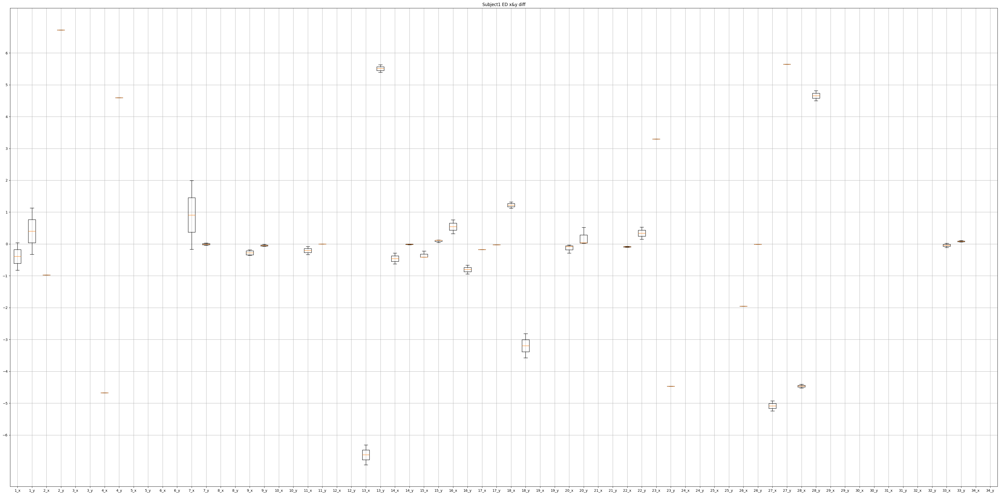

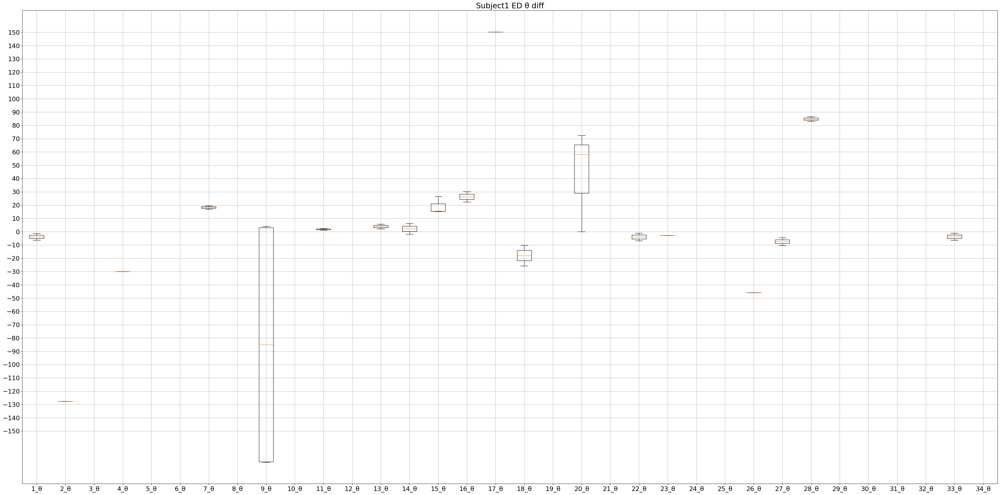

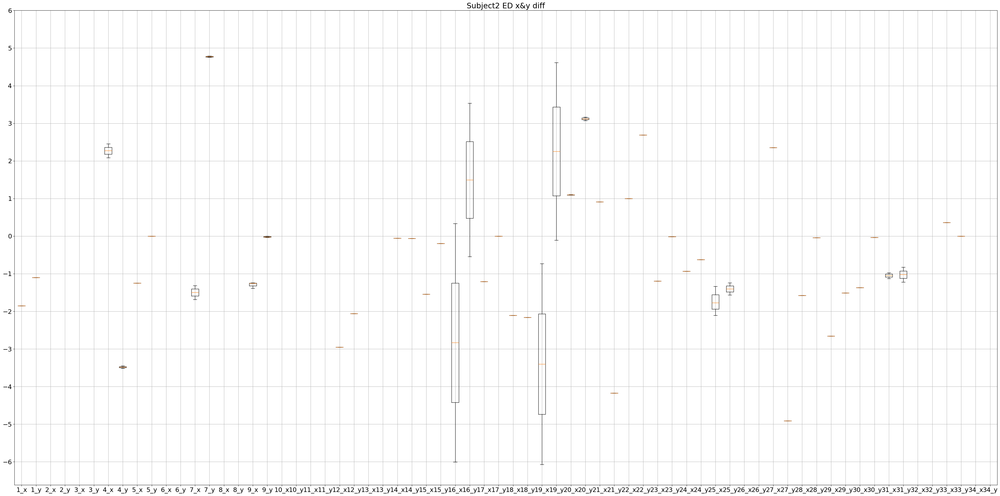

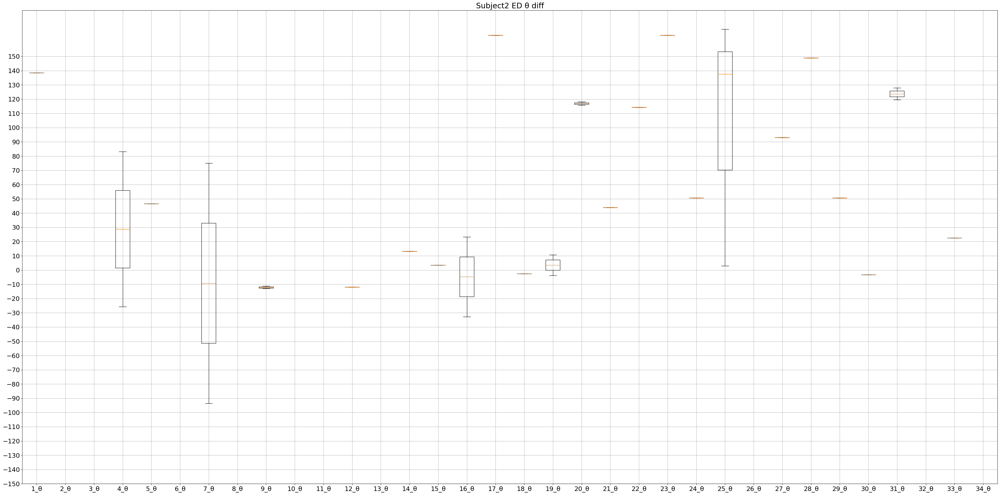

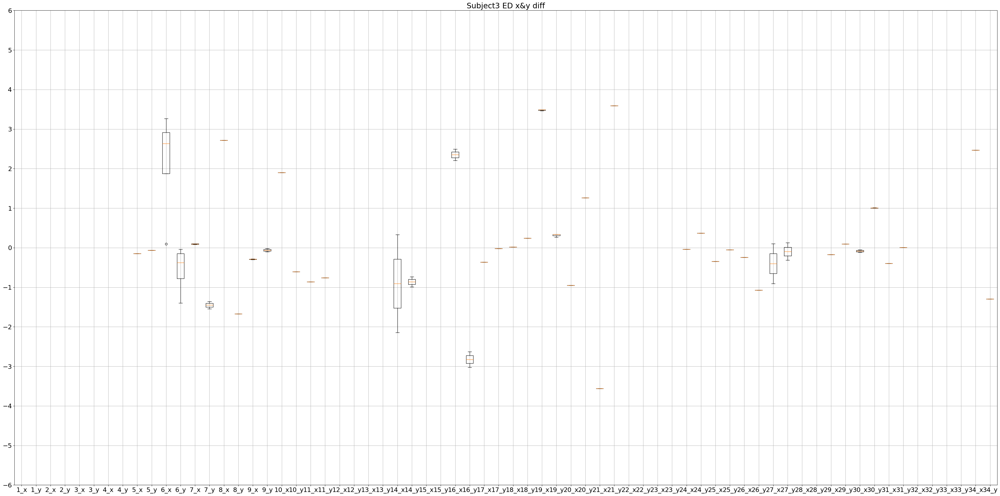

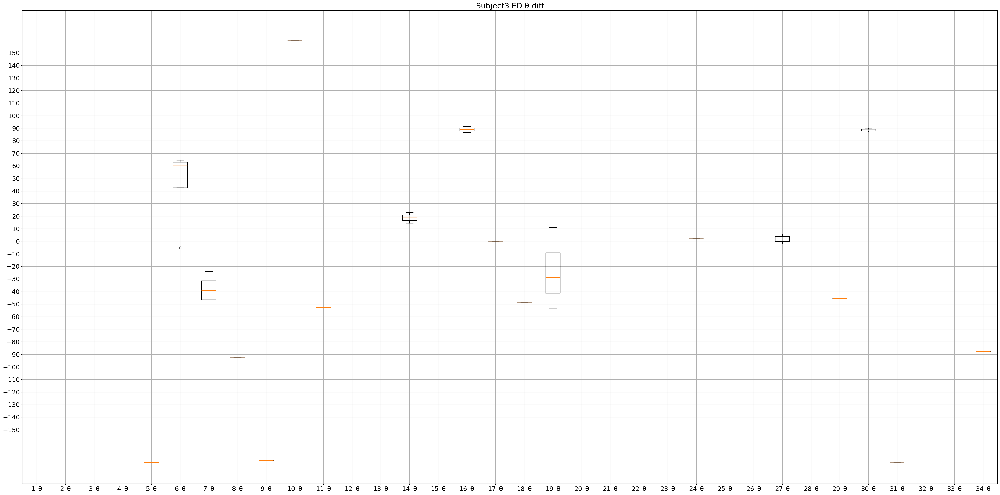

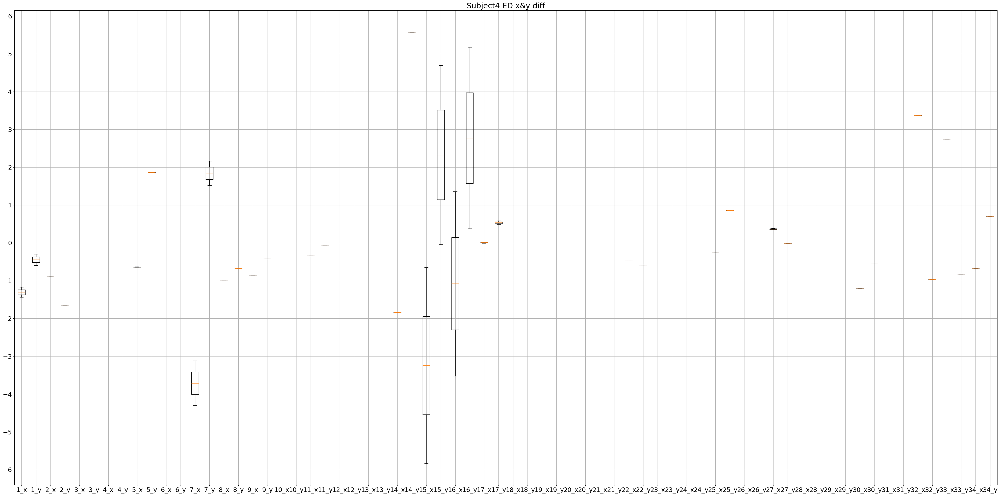

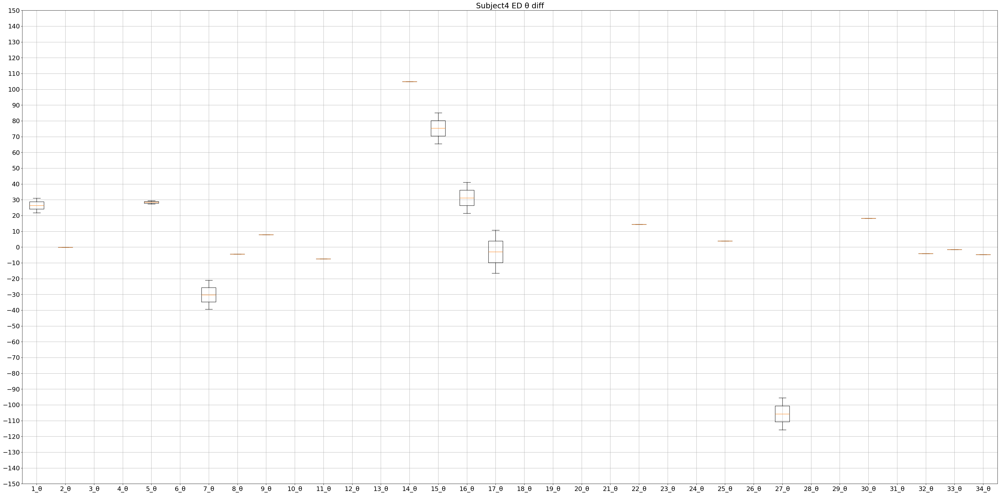

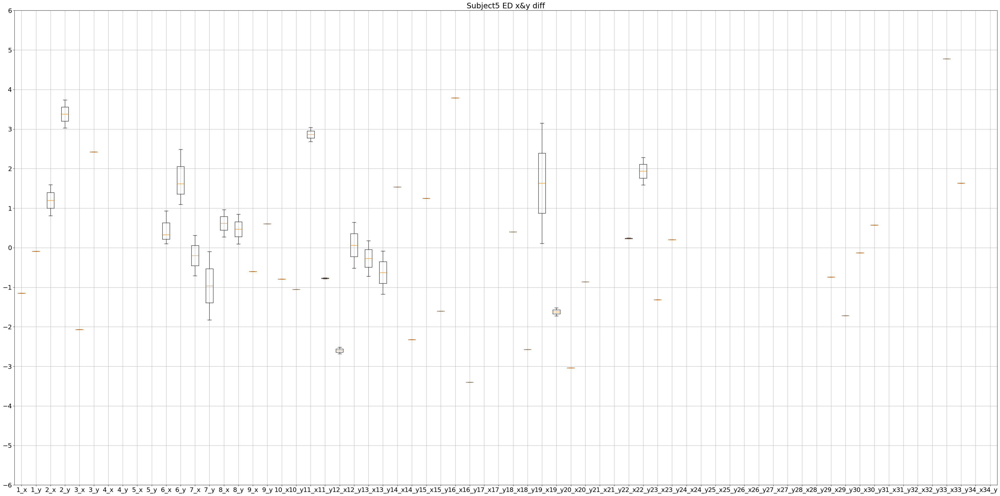

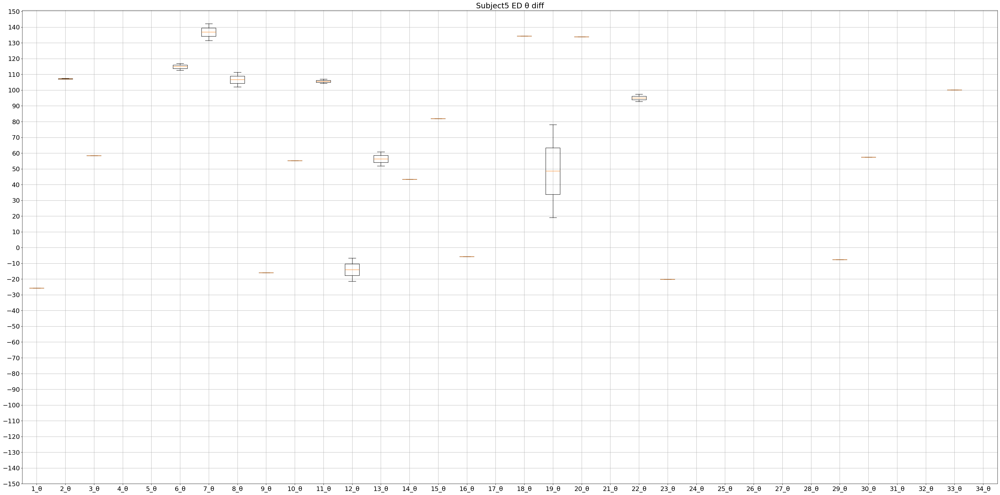

In [64]:
for subject in subjects:
    fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
    ax.boxplot(ED_xy_list[subject])
    ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
    plt.title('Subject'+str(subject)+' ED x&y diff')
    plt.rcParams['font.size'] = 18
    plt.grid()
    plt.yticks(range(-6, 7, 1))
    plt.show()

    fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
    bp = ax.boxplot(ED_theta_list[subject])
    ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
    plt.title('Subject'+str(subject)+' ED θ diff')
    plt.rcParams['font.size'] = 18
    plt.grid()
    plt.yticks(range(-150, 151, 10))
    plt.show()

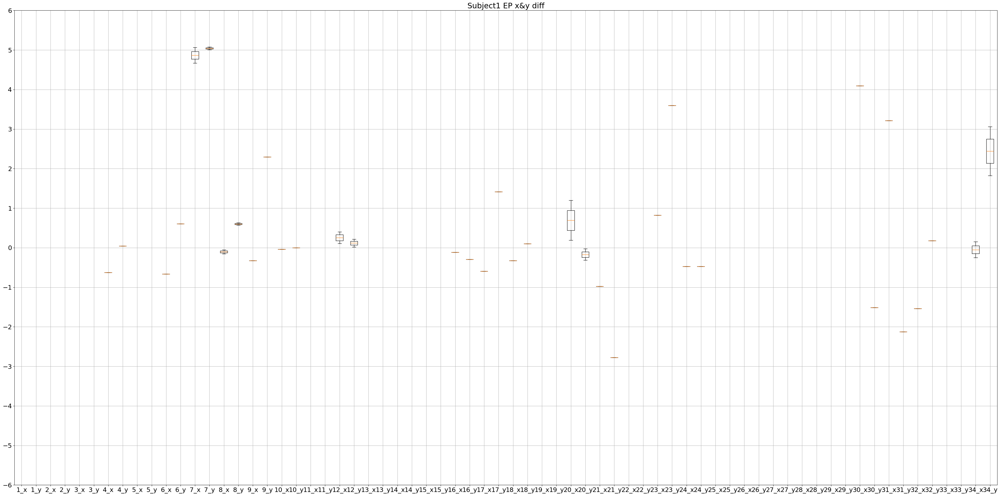

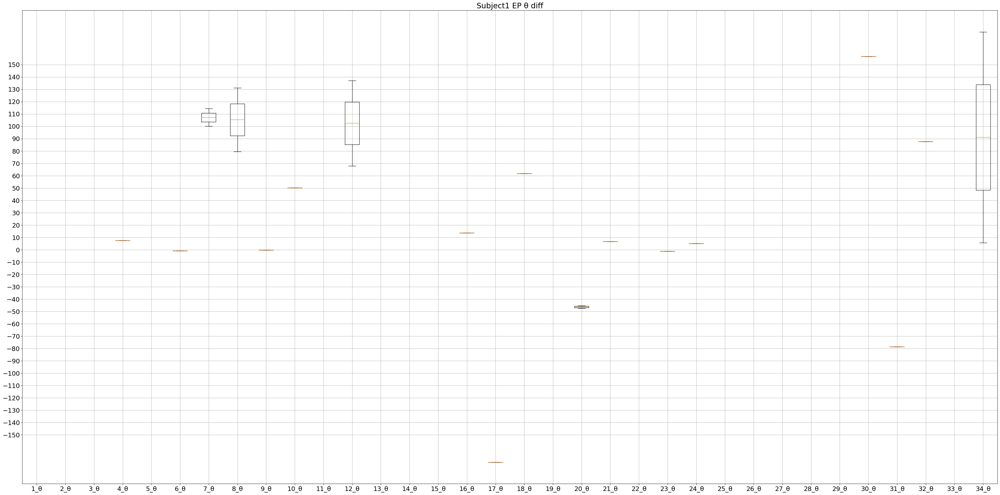

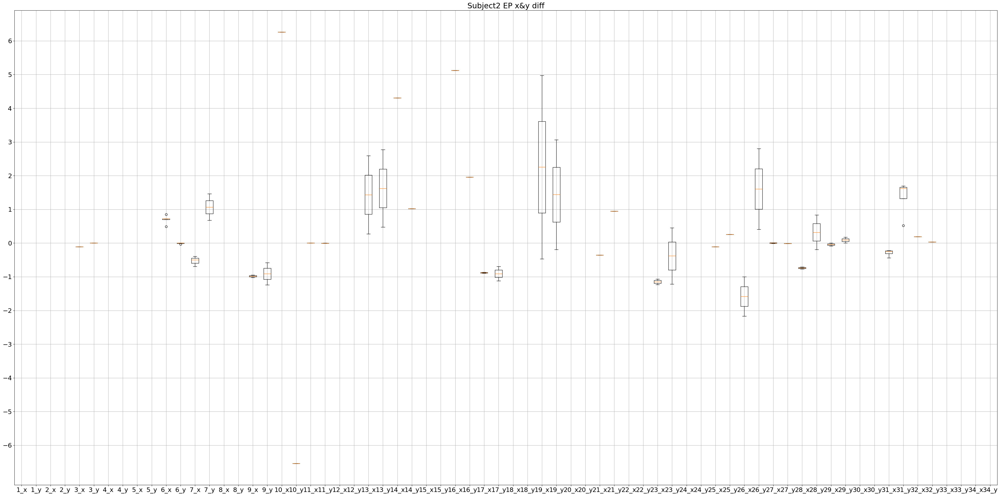

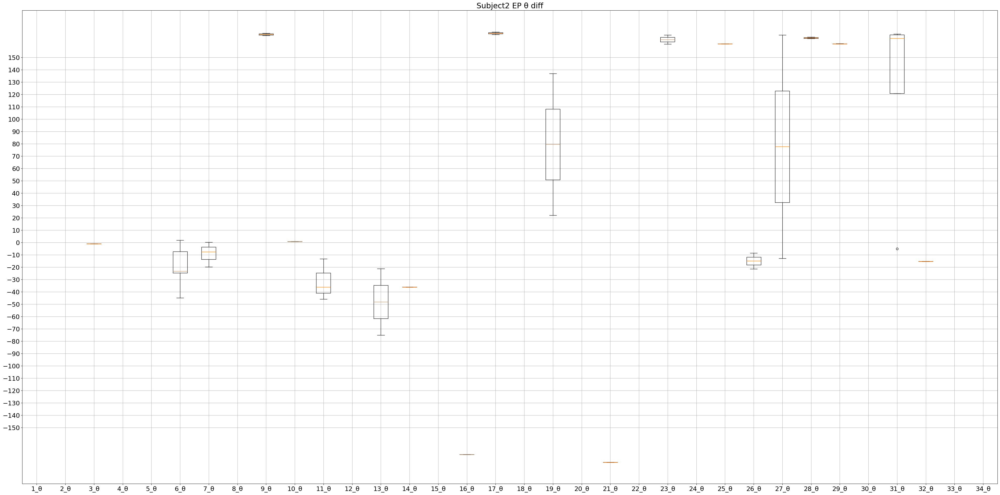

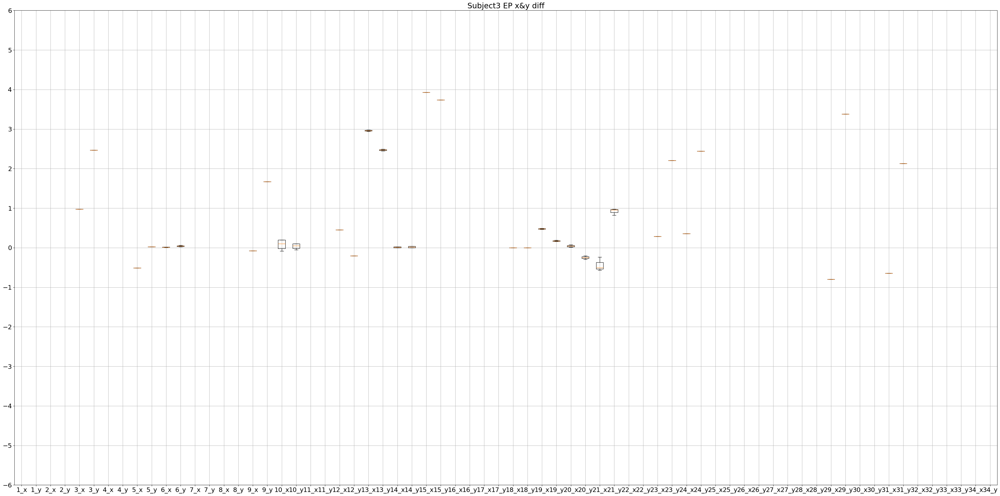

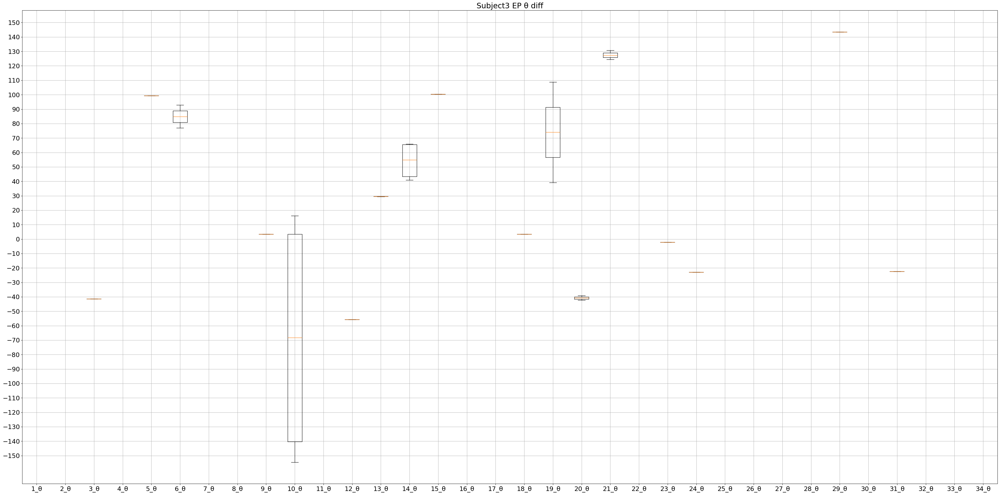

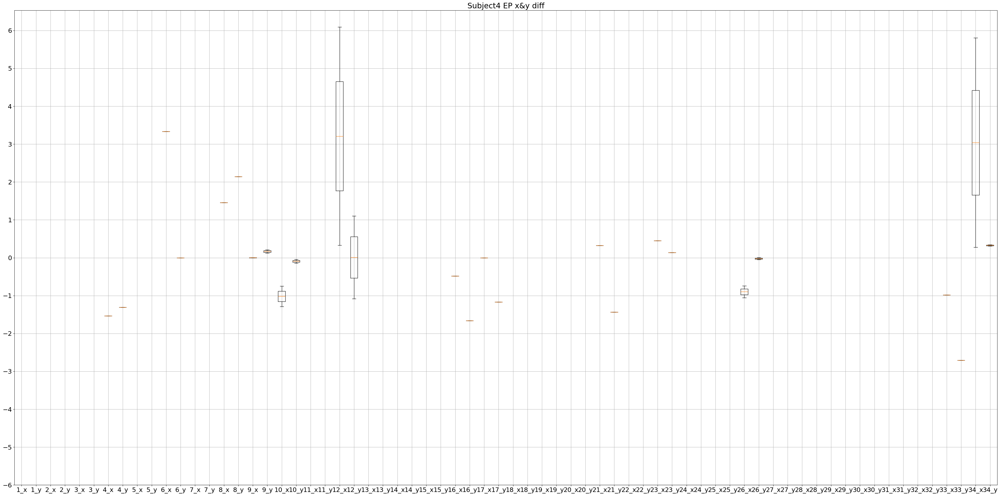

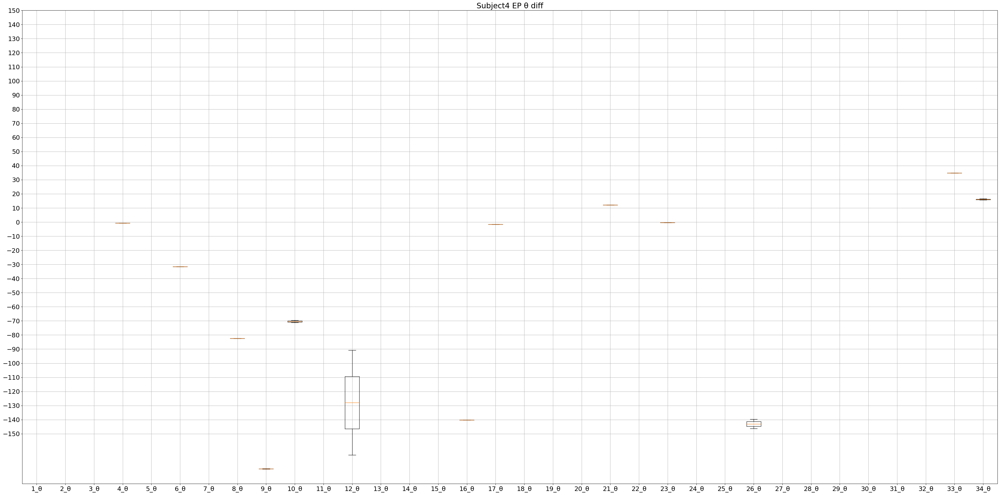

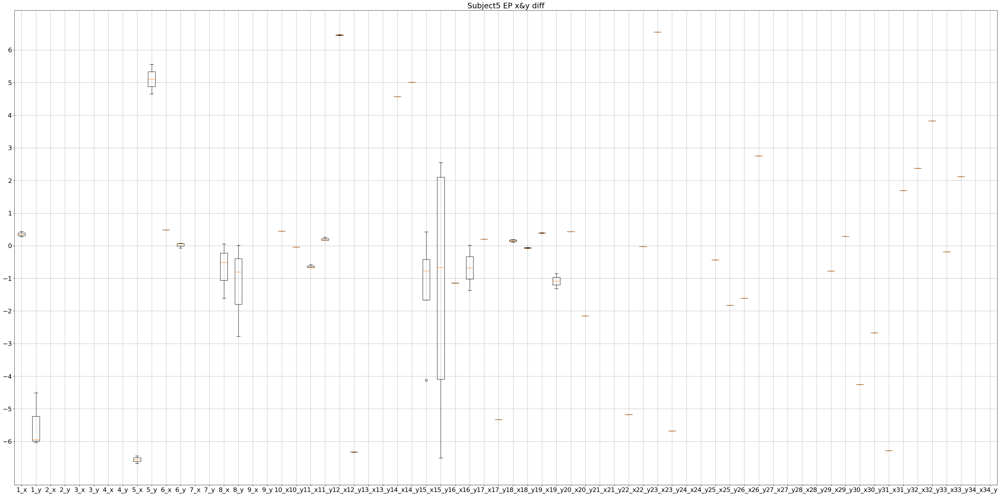

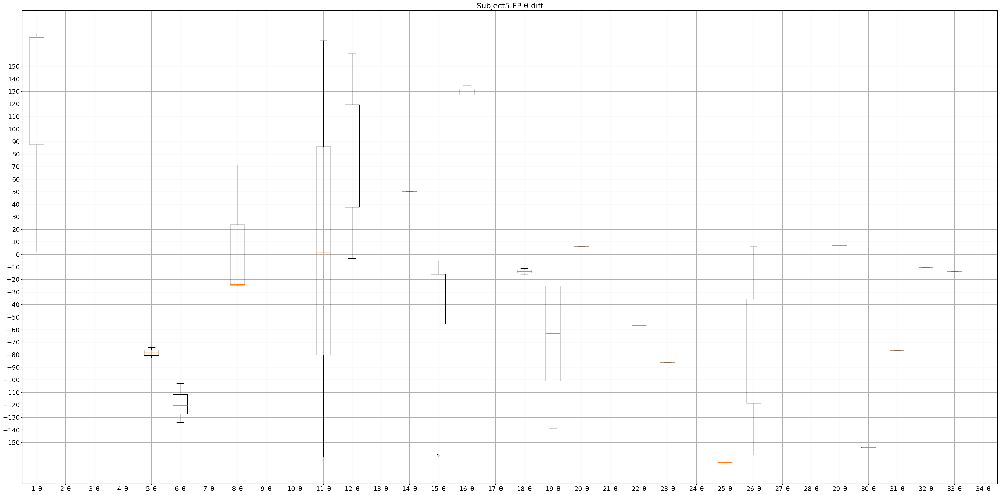

In [65]:
for subject in subjects:
    fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
    ax.boxplot(EP_xy_list[subject])
    ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
    plt.title('Subject'+str(subject)+' EP x&y diff')
    plt.rcParams['font.size'] = 18
    plt.grid()
    plt.yticks(range(-6, 7, 1))
    plt.show()

    fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
    bp = ax.boxplot(EP_theta_list[subject])
    ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
    plt.title('Subject'+str(subject)+' EP θ diff')
    plt.rcParams['font.size'] = 18
    plt.grid()
    plt.yticks(range(-150, 151, 10))
    plt.show()

### 各subjectでの全ジェスチャーの平均値

In [66]:
x_ED_gesture_mean = {}
y_ED_gesture_mean = {}
theta_ED_gesture_mean = {}
x_EP_gesture_mean = {}
y_EP_gesture_mean = {}
theta_EP_gesture_mean = {}
x_FD_gesture_mean = {}
y_FD_gesture_mean = {}
theta_FD_gesture_mean = {}
x_FP_gesture_mean = {}
y_FP_gesture_mean = {}
theta_FP_gesture_mean = {}
for subject in subjects:
    x_ED_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    y_ED_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    theta_ED_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    x_EP_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    y_EP_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    theta_EP_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    x_FD_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    y_FD_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    theta_FD_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    x_FP_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    y_FP_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    theta_FP_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    for i in range(n_gestures):
        for l in range(len(x_ED_gesture[subject][i+1])):
            x_ED_gesture_mean[subject]['value'].append(x_ED_gesture[subject][i+1][l])
            y_ED_gesture_mean[subject]['value'].append(y_ED_gesture[subject][i+1][l])
            theta_ED_gesture_mean[subject]['value'].append(theta_ED_gesture[subject][i+1][l])
        for l in range(len(x_EP_gesture[subject][i+1])):
            x_EP_gesture_mean[subject]['value'].append(x_EP_gesture[subject][i+1][l])
            y_EP_gesture_mean[subject]['value'].append(y_EP_gesture[subject][i+1][l])
            theta_EP_gesture_mean[subject]['value'].append(theta_EP_gesture[subject][i+1][l])
        for l in range(len(x_FD_gesture[subject][i+1])):
            x_FD_gesture_mean[subject]['value'].append(x_FD_gesture[subject][i+1][l])
            y_FD_gesture_mean[subject]['value'].append(y_FD_gesture[subject][i+1][l])
            theta_FD_gesture_mean[subject]['value'].append(theta_FD_gesture[subject][i+1][l])
        for l in range(len(x_FP_gesture[subject][i+1])):
            x_FP_gesture_mean[subject]['value'].append(x_FP_gesture[subject][i+1][l])
            y_FP_gesture_mean[subject]['value'].append(y_FP_gesture[subject][i+1][l])
            theta_FP_gesture_mean[subject]['value'].append(theta_FP_gesture[subject][i+1][l])
    x_ED_gesture_mean[subject]['mean'] = np.mean(x_ED_gesture_mean[subject]['value'])
    x_ED_gesture_mean[subject]['std'] = np.std(x_ED_gesture_mean[subject]['value'])
    y_ED_gesture_mean[subject]['mean'] = np.mean(y_ED_gesture_mean[subject]['value'])
    y_ED_gesture_mean[subject]['std'] = np.std(y_ED_gesture_mean[subject]['value'])
    theta_ED_gesture_mean[subject]['mean'] = np.mean(theta_ED_gesture_mean[subject]['value'])
    theta_ED_gesture_mean[subject]['std'] = np.std(theta_ED_gesture_mean[subject]['value'])
    x_EP_gesture_mean[subject]['mean'] = np.mean(x_EP_gesture_mean[subject]['value'])
    x_EP_gesture_mean[subject]['std'] = np.std(x_EP_gesture_mean[subject]['value'])
    y_EP_gesture_mean[subject]['mean'] = np.mean(y_EP_gesture_mean[subject]['value'])
    y_EP_gesture_mean[subject]['std'] = np.std(y_EP_gesture_mean[subject]['value'])
    theta_EP_gesture_mean[subject]['mean'] = np.mean(theta_EP_gesture_mean[subject]['value'])
    theta_EP_gesture_mean[subject]['std'] = np.std(theta_EP_gesture_mean[subject]['value'])
    x_FD_gesture_mean[subject]['mean'] = np.mean(x_FD_gesture_mean[subject]['value'])
    x_FD_gesture_mean[subject]['std'] = np.std(x_FD_gesture_mean[subject]['value'])
    y_FD_gesture_mean[subject]['mean'] = np.mean(y_FD_gesture_mean[subject]['value'])
    y_FD_gesture_mean[subject]['std'] = np.std(y_FD_gesture_mean[subject]['value'])
    theta_FD_gesture_mean[subject]['mean'] = np.mean(theta_FD_gesture_mean[subject]['value'])
    theta_FD_gesture_mean[subject]['std'] = np.std(theta_FD_gesture_mean[subject]['value'])
    x_FP_gesture_mean[subject]['mean'] = np.mean(x_FP_gesture_mean[subject]['value'])
    x_FP_gesture_mean[subject]['std'] = np.std(x_FP_gesture_mean[subject]['value'])
    y_FP_gesture_mean[subject]['mean'] = np.mean(y_FP_gesture_mean[subject]['value'])
    y_FP_gesture_mean[subject]['std'] = np.std(y_FP_gesture_mean[subject]['value'])
    theta_FP_gesture_mean[subject]['mean'] = np.mean(theta_FP_gesture_mean[subject]['value'])
    theta_FP_gesture_mean[subject]['std'] = np.std(theta_FP_gesture_mean[subject]['value'])

In [67]:
# 表の作成
rows = []
for subject in subjects:
    rows.append([subject, 
                 x_ED_gesture_mean[subject]['mean'], x_ED_gesture_mean[subject]['std'],
                 y_ED_gesture_mean[subject]['mean'], y_ED_gesture_mean[subject]['std'],
                 theta_ED_gesture_mean[subject]['mean'], theta_ED_gesture_mean[subject]['std']])
ED_df = pd.DataFrame(rows, columns=['Subject', 
                                    'x_mean', 'x_std', 'y_mean', 'y_std',
                                    'theta_mean', 'theta_std'])
rows = []
for subject in subjects:
    rows.append([subject, 
                 x_EP_gesture_mean[subject]['mean'], x_EP_gesture_mean[subject]['std'],
                 y_EP_gesture_mean[subject]['mean'], y_EP_gesture_mean[subject]['std'],
                 theta_EP_gesture_mean[subject]['mean'], theta_EP_gesture_mean[subject]['std']])
EP_df = pd.DataFrame(rows, columns=['Subject', 
                                    'x_mean', 'x_std', 'y_mean', 'y_std',
                                    'theta_mean', 'theta_std'])
rows = []
for subject in subjects:
    rows.append([subject, 
                 x_FD_gesture_mean[subject]['mean'], x_FD_gesture_mean[subject]['std'],
                 y_FD_gesture_mean[subject]['mean'], y_FD_gesture_mean[subject]['std'],
                 theta_FD_gesture_mean[subject]['mean'], theta_FD_gesture_mean[subject]['std']])
FD_df = pd.DataFrame(rows, columns=['Subject', 
                                    'x_mean', 'x_std', 'y_mean', 'y_std',
                                    'theta_mean', 'theta_std'])
rows = []
for subject in subjects:
    rows.append([subject, 
                 x_FP_gesture_mean[subject]['mean'], x_FP_gesture_mean[subject]['std'],
                 y_FP_gesture_mean[subject]['mean'], y_FP_gesture_mean[subject]['std'],
                 theta_FP_gesture_mean[subject]['mean'], theta_FP_gesture_mean[subject]['std']])
FP_df = pd.DataFrame(rows, columns=['Subject', 
                                    'x_mean', 'x_std', 'y_mean', 'y_std',
                                    'theta_mean', 'theta_std'])

In [68]:
ED_df

,Subject,x_mean,x_std,y_mean,y_std,theta_mean,theta_std
0,1,-0.983011,2.272096,0.885591,2.595269,-0.192762,59.112368
1,2,-1.000676,1.853015,-0.123326,2.379833,53.807615,68.354704
2,3,0.624159,1.712854,-0.297234,1.166503,-10.705850,87.931779
3,4,-0.824004,1.912521,0.769243,1.866388,6.879091,45.703196
4,5,0.320240,1.789446,0.023382,1.711305,69.350407,52.611914


In [69]:
EP_df

,Subject,x_mean,x_std,y_mean,y_std,theta_mean,theta_std
0,1,0.598507,1.790268,0.743560,1.945770,37.258591,80.332294
1,2,0.316613,1.793559,0.300454,1.487802,47.056587,102.532283
2,3,0.344468,1.072619,0.886690,1.201811,28.439178,74.165645
3,4,0.624701,2.171890,-0.289796,1.081242,-67.239184,72.818751
4,5,-0.347113,2.963185,-0.751762,3.226609,-11.712397,101.512400


In [70]:
FD_df

,Subject,x_mean,x_std,y_mean,y_std,theta_mean,theta_std
0,1,1.054951,1.841544,-0.626217,0.819844,10.502898,41.600278
1,2,0.550615,2.664025,0.228537,2.246569,5.827645,58.305140
2,3,-0.206677,2.596978,0.188406,2.348718,-43.157863,78.601891
3,4,0.826351,2.675427,0.260502,1.684509,-13.087717,72.212942
4,5,2.419674,3.115265,-0.726911,1.949272,37.627655,58.714490


In [71]:
FP_df

,Subject,x_mean,x_std,y_mean,y_std,theta_mean,theta_std
0,1,0.313573,1.009504,0.316333,0.702964,-20.330169,60.212588
1,2,-0.880671,4.472610,-0.103266,3.752413,28.160654,56.144615
2,3,0.994634,3.412000,2.076120,2.794854,51.325395,38.059947
3,4,-0.469230,1.466144,0.535280,1.618500,-25.958782,71.617670
4,5,1.122629,1.744482,-0.808056,2.770614,-40.991067,65.751770


### 各被験者の全ジェスチャー・全電極位置の平均値

In [72]:
x_gesture_mean = {}
y_gesture_mean = {}
theta_gesture_mean = {}
for subject in subjects:
    x_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    y_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    theta_gesture_mean[subject] = {'value':[], 'mean':0, 'std':0}
    for i in range(n_gestures):
        for l in range(len(x_ED_gesture[subject][i+1])):
            x_gesture_mean[subject]['value'].append(x_ED_gesture[subject][i+1][l])
            y_gesture_mean[subject]['value'].append(y_ED_gesture[subject][i+1][l])
            theta_gesture_mean[subject]['value'].append(theta_ED_gesture[subject][i+1][l])
        for l in range(len(x_EP_gesture[subject][i+1])):
            x_gesture_mean[subject]['value'].append(x_EP_gesture[subject][i+1][l])
            y_gesture_mean[subject]['value'].append(y_EP_gesture[subject][i+1][l])
            theta_gesture_mean[subject]['value'].append(theta_EP_gesture[subject][i+1][l])
        for l in range(len(x_FD_gesture[subject][i+1])):
            x_gesture_mean[subject]['value'].append(x_FD_gesture[subject][i+1][l])
            y_gesture_mean[subject]['value'].append(y_FD_gesture[subject][i+1][l])
            theta_gesture_mean[subject]['value'].append(theta_FD_gesture[subject][i+1][l])
        for l in range(len(x_FP_gesture[subject][i+1])):
            x_gesture_mean[subject]['value'].append(x_FP_gesture[subject][i+1][l])
            y_gesture_mean[subject]['value'].append(y_FP_gesture[subject][i+1][l])
            theta_gesture_mean[subject]['value'].append(theta_FP_gesture[subject][i+1][l])
    x_gesture_mean[subject]['mean'] = np.mean(x_gesture_mean[subject]['value'])
    x_gesture_mean[subject]['std'] = np.std(x_gesture_mean[subject]['value'])
    y_gesture_mean[subject]['mean'] = np.mean(y_gesture_mean[subject]['value'])
    y_gesture_mean[subject]['std'] = np.std(y_gesture_mean[subject]['value'])
    theta_gesture_mean[subject]['mean'] = np.mean(theta_gesture_mean[subject]['value'])
    theta_gesture_mean[subject]['std'] = np.std(theta_gesture_mean[subject]['value'])

In [73]:
# 表の作成
rows = []
for subject in subjects:
    rows.append([subject, 
                 x_gesture_mean[subject]['mean'], x_gesture_mean[subject]['std'],
                 y_gesture_mean[subject]['mean'], y_gesture_mean[subject]['std'],
                 theta_gesture_mean[subject]['mean'], theta_gesture_mean[subject]['std']])
mean_std_df = pd.DataFrame(rows, columns=['Subject', 
                                    'x_mean', 'x_std', 'y_mean', 'y_std',
                                    'theta_mean', 'theta_std'])
mean_std_df

,Subject,x_mean,x_std,y_mean,y_std,theta_mean,theta_std
0,1,0.242900,1.981753,0.244919,1.794446,4.821294,61.758656
1,2,-0.188787,2.900101,0.094005,2.527161,33.416533,77.360727
2,3,0.362031,2.219834,0.489701,2.019672,-0.894164,83.462782
3,4,-0.017513,2.180952,0.378501,1.660674,-21.740314,71.001108
4,5,0.852026,2.834883,-0.562354,2.515671,18.159590,84.223217


## 全subjectsでの分析

In [74]:
x_ED_gesture = {}
y_ED_gesture = {}
theta_ED_gesture = {}
x_EP_gesture = {}
y_EP_gesture = {}
theta_EP_gesture = {}
x_FD_gesture = {}
y_FD_gesture = {}
theta_FD_gesture = {}
x_FP_gesture = {}
y_FP_gesture = {}
theta_FP_gesture = {}
n_gestures = 34
for i in range(n_gestures):
    x_ED_gesture[i+1] = []
    y_ED_gesture[i+1] = []
    theta_ED_gesture[i+1] = []
    x_EP_gesture[i+1] = []
    y_EP_gesture[i+1] = []
    theta_EP_gesture[i+1] = []
    x_FD_gesture[i+1] = []
    y_FD_gesture[i+1] = []
    theta_FD_gesture[i+1] = []
    x_FP_gesture[i+1] = []
    y_FP_gesture[i+1] = []
    theta_FP_gesture[i+1] = []

In [75]:
for diff_list in distances:
    print(diff_list)
    if diff_list['result_distance'] != [None]:
        gesture = int(diff_list['gesture'])
        electrode_place = diff_list['electrode_place']
        if electrode_place == 'ED':
            for diff in diff_list['result_distance']:
                x_ED_gesture[gesture].append(diff['x_distance'])
                y_ED_gesture[gesture].append(diff['y_distance'])
                theta_ED_gesture[gesture].append(diff['theta_distance'])
        elif electrode_place == 'EP':
            for diff in diff_list['result_distance']:
                x_EP_gesture[gesture].append(diff['x_distance'])
                y_EP_gesture[gesture].append(diff['y_distance'])
                theta_EP_gesture[gesture].append(diff['theta_distance'])
        elif electrode_place == 'FD':
            for diff in diff_list['result_distance']:
                x_FD_gesture[gesture].append(diff['x_distance'])
                y_FD_gesture[gesture].append(diff['y_distance'])
                theta_FD_gesture[gesture].append(diff['theta_distance'])
        elif electrode_place == 'FP':
            for diff in diff_list['result_distance']:
                x_FP_gesture[gesture].append(diff['x_distance'])
                y_FP_gesture[gesture].append(diff['y_distance'])
                theta_FP_gesture[gesture].append(diff['theta_distance'])

{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'ED', 'result_distance': [{'session1_cluster': 0, 'session2_cluster': 10, 'x_distance': 0.04006794023298177, 'y_distance': 1.126529183987607, 'theta_distance': -6.445998477061465}]}
{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'EP', 'result_distance': [None]}
{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'FD', 'result_distance': [{'session1_cluster': 20, 'session2_cluster': 0, 'x_distance': 2.4236722073525145, 'y_distance': -1.6043683127963981, 'theta_distance': 16.99427437131255}]}
{'subject': 1, 'gesture': '1', 'trial': 1, 'electrode_place': 'FP', 'result_distance': [None]}
{'subject': 1, 'gesture': '1', 'trial': 2, 'electrode_place': 'ED', 'result_distance': [{'session1_cluster': 0, 'session2_cluster': 0, 'x_distance': -0.8231131609875808, 'y_distance': -0.323744425910923, 'theta_distance': -1.3362237976709324}]}
{'subject': 1, 'gesture': '1', 'trial': 2, 'electrode_place': 'EP', 'result_d

In [76]:
ED_xy_list = []
EP_xy_list = []
FD_xy_list = []
FP_xy_list = []
for i in range(n_gestures):
    ED_xy_list.append(x_ED_gesture[i+1])
    ED_xy_list.append(y_ED_gesture[i+1])
    # ED_list.append(theta_ED_gesture[i+1])
for i in range(n_gestures):
    EP_xy_list.append(x_EP_gesture[i+1])
    EP_xy_list.append(y_EP_gesture[i+1])
    # EP_list.append(theta_EP_gesture[i+1])
for i in range(n_gestures):
    FD_xy_list.append(x_FD_gesture[i+1])
    FD_xy_list.append(y_FD_gesture[i+1])
    # FD_list.append(theta_FD_gesture[i+1])
for i in range(n_gestures):
    FP_xy_list.append(x_FP_gesture[i+1])
    FP_xy_list.append(y_FP_gesture[i+1])
    # FP_list.append(theta_FP_gesture[i+1])

ED_theta_list = []
EP_theta_list = []
FD_theta_list = []
FP_theta_list = []
for i in range(n_gestures):
    ED_theta_list.append(theta_ED_gesture[i+1])
for i in range(n_gestures):
    EP_theta_list.append(theta_EP_gesture[i+1])
for i in range(n_gestures):
    FD_theta_list.append(theta_FD_gesture[i+1])
for i in range(n_gestures):
    FP_theta_list.append(theta_FP_gesture[i+1])


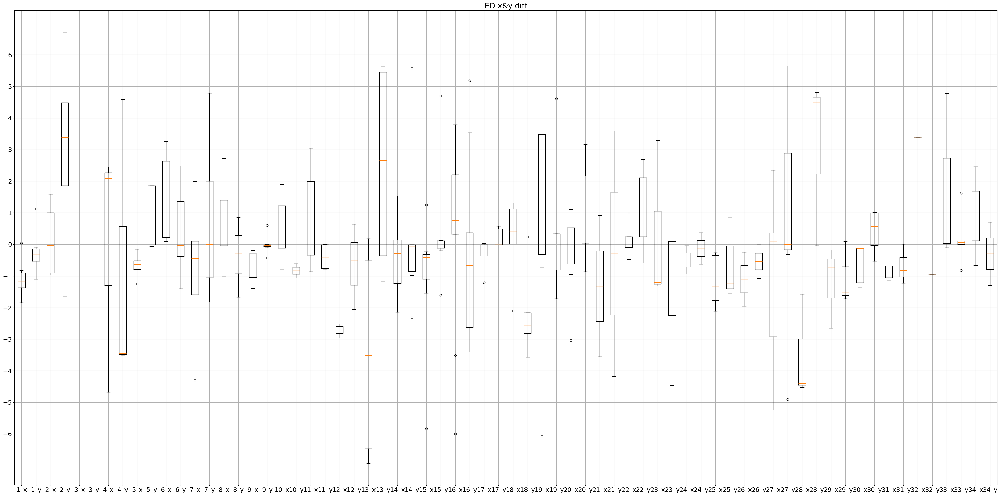

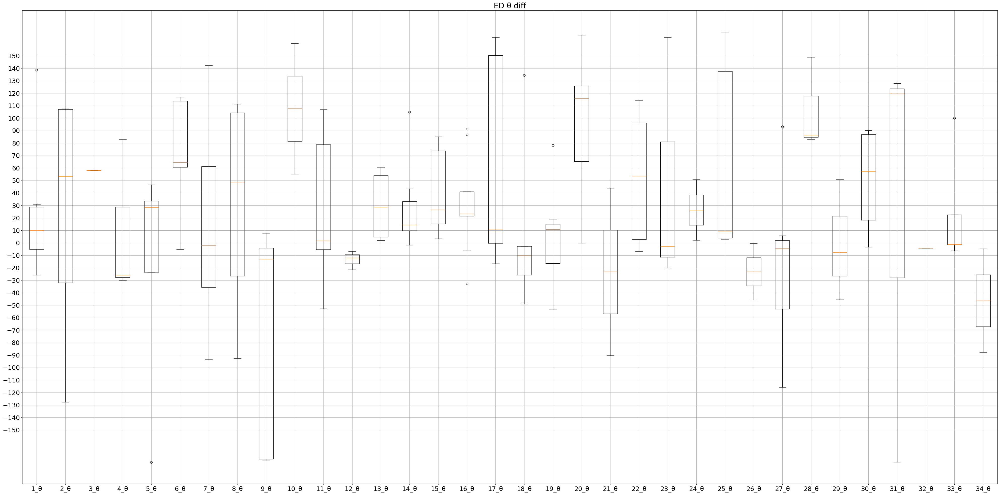

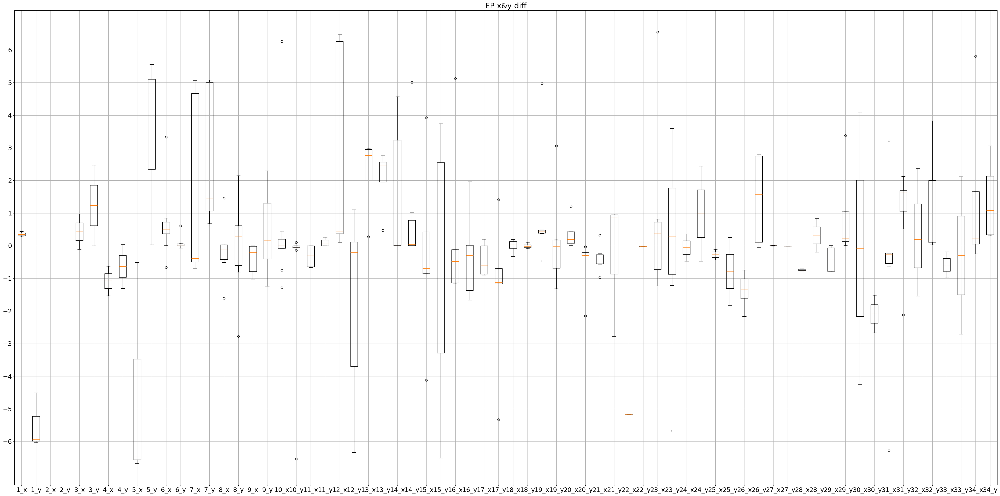

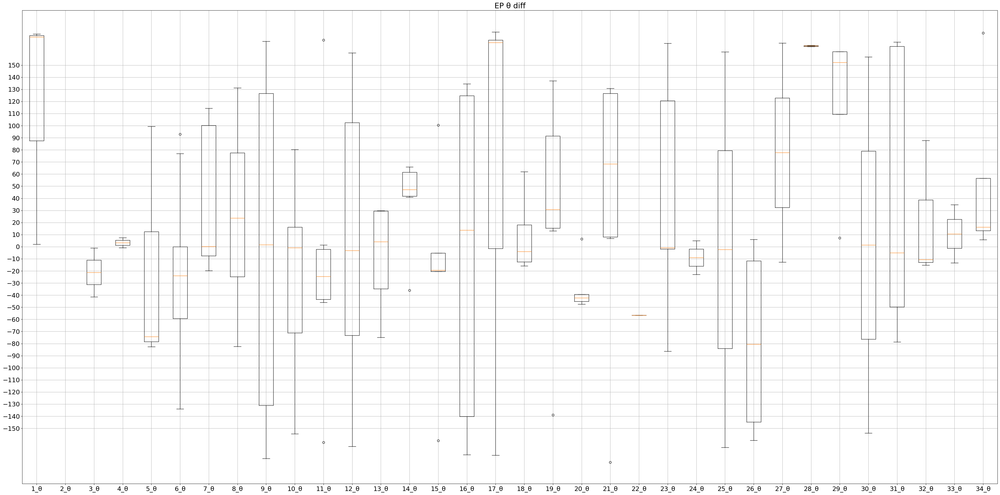

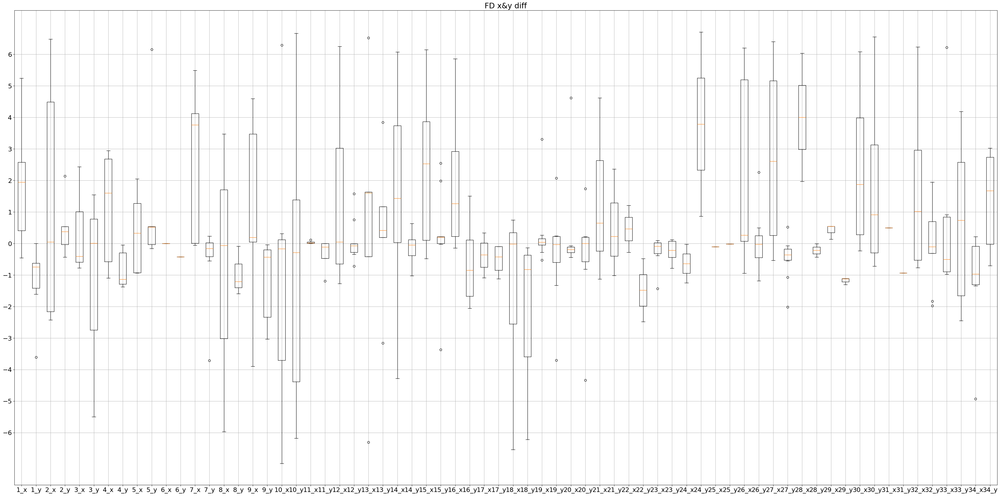

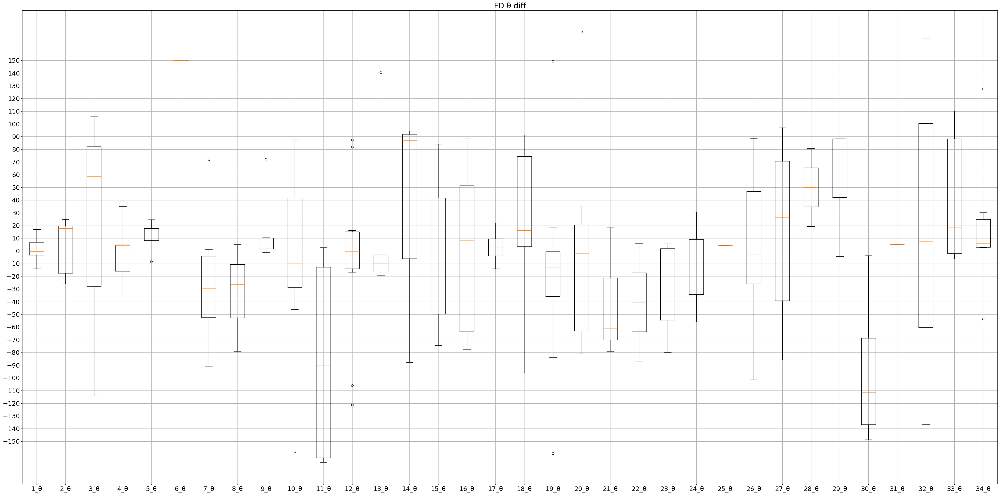

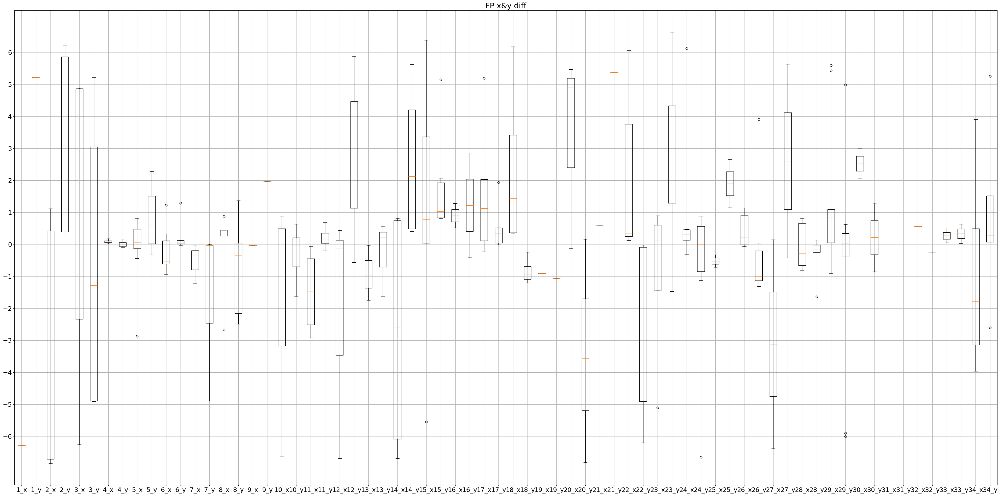

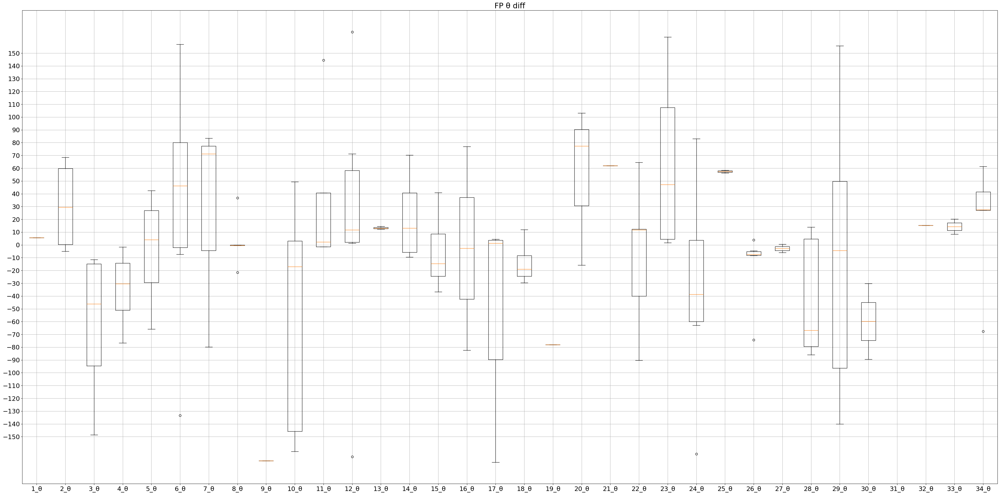

In [77]:
fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
ax.boxplot(ED_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('ED x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(ED_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('ED θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(EP_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('EP x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(EP_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('EP θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FD_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('FD x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FD_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('FD θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FP_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('FP x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FP_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('FP θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

# テスト

In [66]:
x_ED_gesture = {}
y_ED_gesture = {}
theta_ED_gesture = {}
x_EP_gesture = {}
y_EP_gesture = {}
theta_EP_gesture = {}
x_FD_gesture = {}
y_FD_gesture = {}
theta_FD_gesture = {}
x_FP_gesture = {}
y_FP_gesture = {}
theta_FP_gesture = {}
n_gestures = 34
for i in range(n_gestures):
    x_ED_gesture[i+1] = []
    y_ED_gesture[i+1] = []
    theta_ED_gesture[i+1] = []
    x_EP_gesture[i+1] = []
    y_EP_gesture[i+1] = []
    theta_EP_gesture[i+1] = []
    x_FD_gesture[i+1] = []
    y_FD_gesture[i+1] = []
    theta_FD_gesture[i+1] = []
    x_FP_gesture[i+1] = []
    y_FP_gesture[i+1] = []
    theta_FP_gesture[i+1] = []

In [67]:
for diff_list in distances:
    print(diff_list)
    if diff_list['result_distance'] != [None]:
        gesture = diff_list['gesture']
        electrode_place = diff_list['electrode_place']
        if electrode_place == 'ED':
            for diff in diff_list['result_distance']:
                x_ED_gesture[gesture].append(diff['x_distance'])
                y_ED_gesture[gesture].append(diff['y_distance'])
                theta_ED_gesture[gesture].append(diff['theta_distance'])
        elif electrode_place == 'EP':
            for diff in diff_list['result_distance']:
                x_EP_gesture[gesture].append(diff['x_distance'])
                y_EP_gesture[gesture].append(diff['y_distance'])
                theta_EP_gesture[gesture].append(diff['theta_distance'])
        elif electrode_place == 'FD':
            for diff in diff_list['result_distance']:
                x_FD_gesture[gesture].append(diff['x_distance'])
                y_FD_gesture[gesture].append(diff['y_distance'])
                theta_FD_gesture[gesture].append(diff['theta_distance'])
        elif electrode_place == 'FP':
            for diff in diff_list['result_distance']:
                x_FP_gesture[gesture].append(diff['x_distance'])
                y_FP_gesture[gesture].append(diff['y_distance'])
                theta_FP_gesture[gesture].append(diff['theta_distance'])

{'subject': 1, 'gesture': 1, 'trial': 1, 'electrode_place': 'ED', 'result_distance': [{'session1_cluster': 0, 'session2_cluster': 20, 'x_distance': 0.6355043368060231, 'y_distance': 0.2968244295037339, 'theta_distance': 126.80880311567324}, {'session1_cluster': 1, 'session2_cluster': 20, 'x_distance': 0.8046718794426484, 'y_distance': 0.20238527097442738, 'theta_distance': 6.995579169369314}, {'session1_cluster': 2, 'session2_cluster': 20, 'x_distance': 0.34048013321548076, 'y_distance': 0.3659353932278293, 'theta_distance': -18.365583335385004}, {'session1_cluster': 30, 'session2_cluster': 10, 'x_distance': -0.02485568984674824, 'y_distance': -0.05747863767190342, 'theta_distance': 9.093665741959128}]}
{'subject': 1, 'gesture': 1, 'trial': 1, 'electrode_place': 'EP', 'result_distance': [{'session1_cluster': 20, 'session2_cluster': 31, 'x_distance': 1.3986981499463313, 'y_distance': -3.0642257542032985, 'theta_distance': -72.11244356834571}, {'session1_cluster': 30, 'session2_cluster':

In [68]:
ED_xy_list = []
EP_xy_list = []
FD_xy_list = []
FP_xy_list = []
for i in range(n_gestures):
    ED_xy_list.append(x_ED_gesture[i+1])
    ED_xy_list.append(y_ED_gesture[i+1])
    # ED_list.append(theta_ED_gesture[i+1])
for i in range(n_gestures):
    EP_xy_list.append(x_EP_gesture[i+1])
    EP_xy_list.append(y_EP_gesture[i+1])
    # EP_list.append(theta_EP_gesture[i+1])
for i in range(n_gestures):
    FD_xy_list.append(x_FD_gesture[i+1])
    FD_xy_list.append(y_FD_gesture[i+1])
    # FD_list.append(theta_FD_gesture[i+1])
for i in range(n_gestures):
    FP_xy_list.append(x_FP_gesture[i+1])
    FP_xy_list.append(y_FP_gesture[i+1])
    # FP_list.append(theta_FP_gesture[i+1])

ED_theta_list = []
EP_theta_list = []
FD_theta_list = []
FP_theta_list = []
for i in range(n_gestures):
    ED_theta_list.append(theta_ED_gesture[i+1])
for i in range(n_gestures):
    EP_theta_list.append(theta_EP_gesture[i+1])
for i in range(n_gestures):
    FD_theta_list.append(theta_FD_gesture[i+1])
for i in range(n_gestures):
    FP_theta_list.append(theta_FP_gesture[i+1])


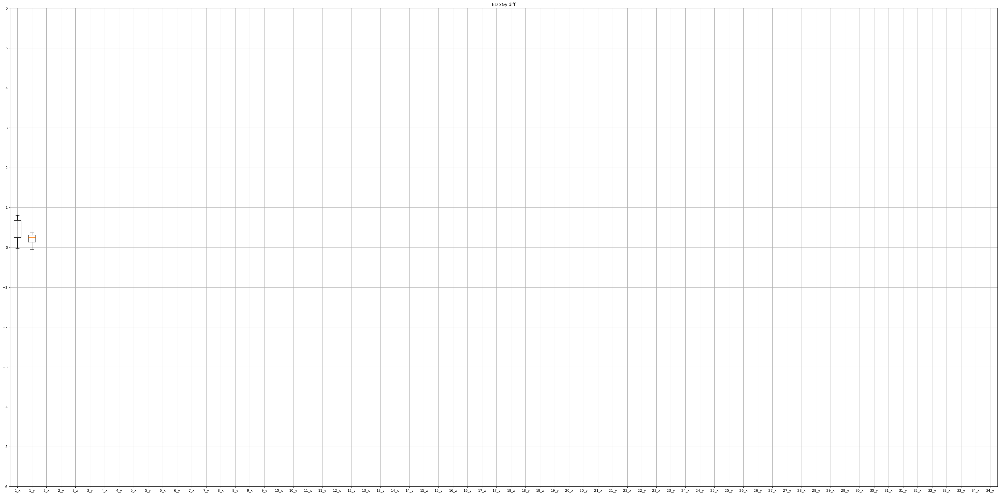

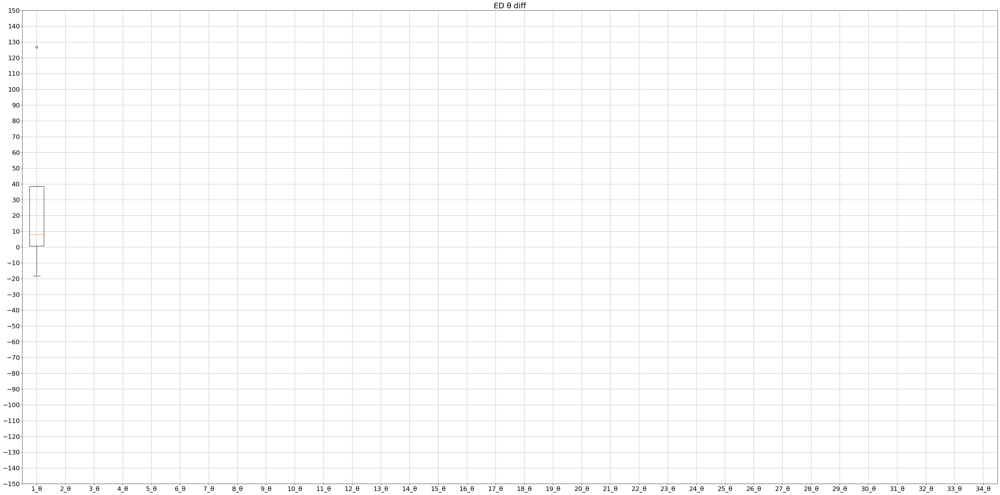

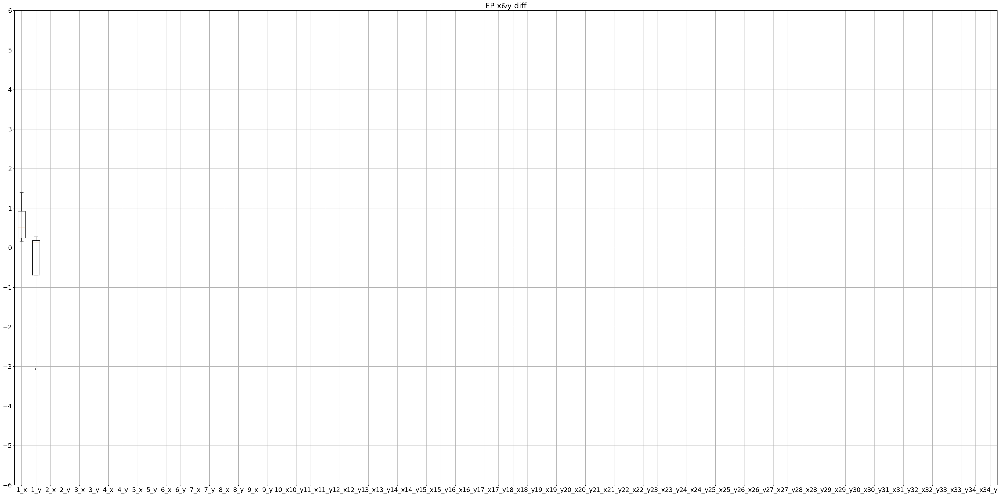

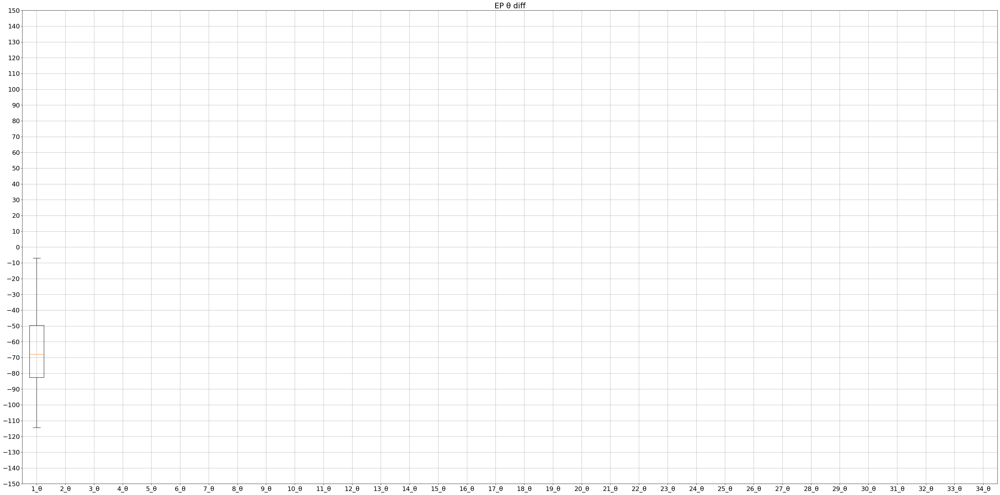

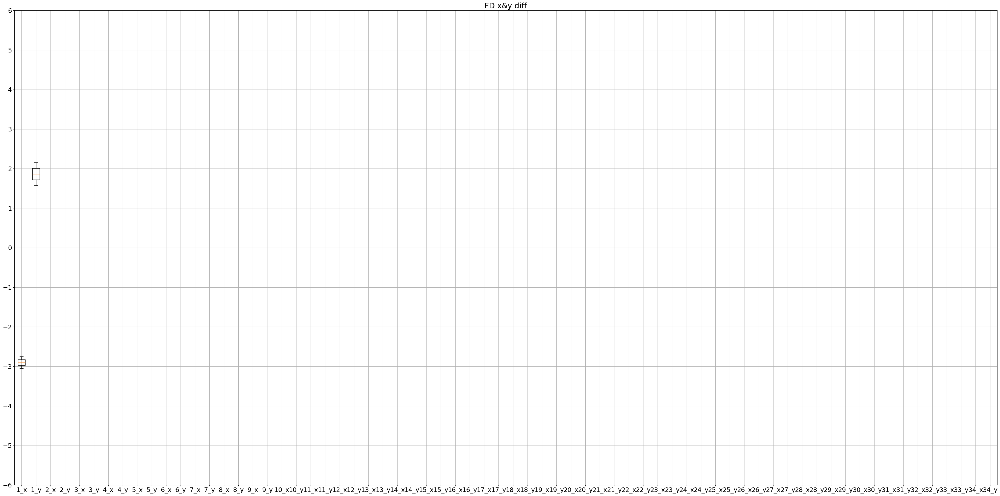

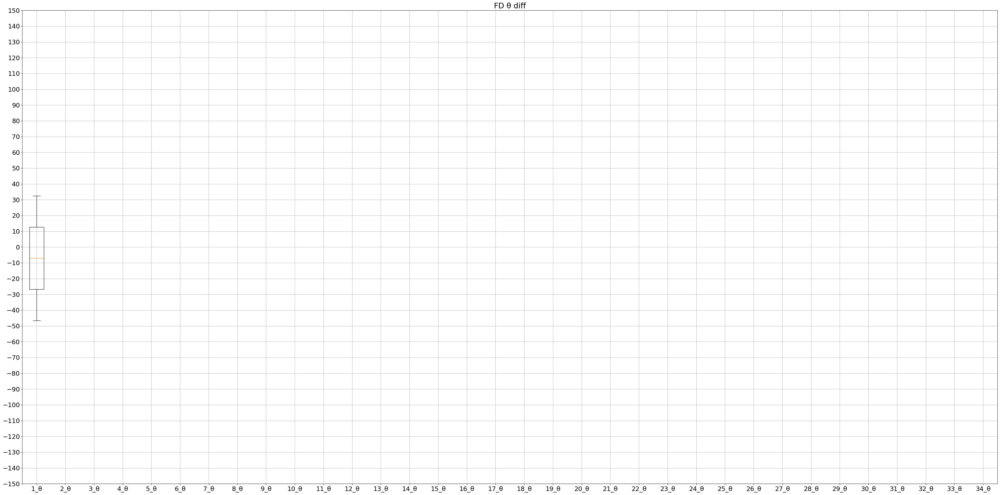

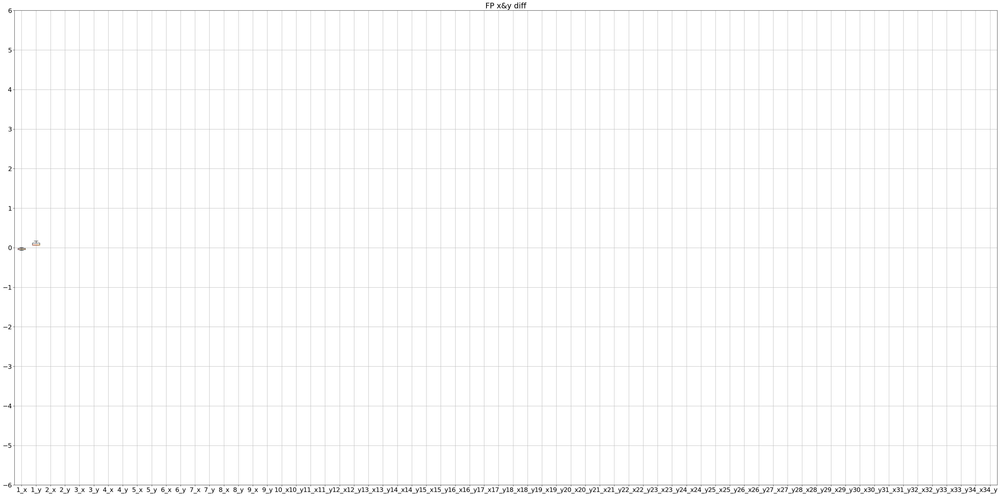

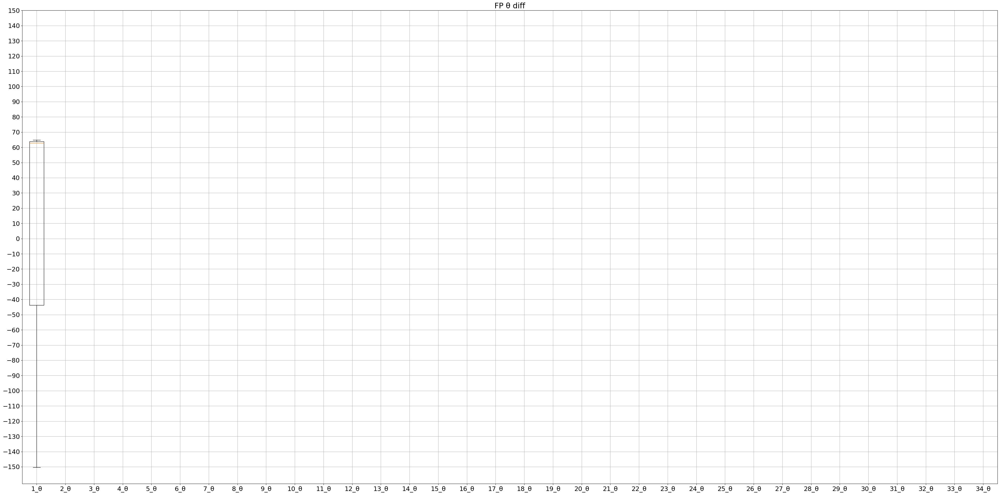

In [69]:
fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
ax.boxplot(ED_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('ED x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(ED_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('ED θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(EP_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('EP x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(EP_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('EP θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FD_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('FD x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FD_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('FD θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FP_xy_list)
ax.set_xticklabels(['1_x','1_y','2_x','2_y','3_x','3_y','4_x','4_y','5_x','5_y','6_x','6_y','7_x','7_y','8_x','8_y','9_x','9_y','10_x','10_y','11_x','11_y','12_x','12_y','13_x','13_y','14_x','14_y','15_x','15_y','16_x','16_y','17_x','17_y','18_x','18_y','19_x','19_y','20_x','20_y','21_x','21_y','22_x','22_y','23_x','23_y','24_x','24_y','25_x','25_y','26_x','26_y','27_x','27_y','28_x','28_y','29_x','29_y','30_x','30_y','31_x','31_y','32_x','32_y','33_x','33_y','34_x','34_y'])
plt.title('FP x&y diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-6, 7, 1))
plt.show()

fig, ax = plt.subplots(figsize=(40,20), tight_layout=True)
bp = ax.boxplot(FP_theta_list)
ax.set_xticklabels(['1_θ','2_θ','3_θ','4_θ','5_θ','6_θ','7_θ','8_θ','9_θ','10_θ','11_θ','12_θ','13_θ','14_θ','15_θ','16_θ','17_θ','18_θ','19_θ','20_θ','21_θ','22_θ','23_θ','24_θ','25_θ','26_θ','27_θ','28_θ','29_θ','30_θ','31_θ','32_θ','33_θ','34_θ'])
plt.title('FP θ diff')
plt.rcParams['font.size'] = 18
plt.grid()
plt.yticks(range(-150, 151, 10))
plt.show()

In [430]:
x_EP_gesture

{1: [3.9834823697861856,
  0.7655725323054208,
  3.10617847342346,
  4.05349287187996,
  0.02115415804537779,
  4.334289507071547,
  -2.0264028596544827,
  0.4968693264360893,
  -5.847779801428611,
  -3.4256882912377815,
  5.088462625187774,
  -2.815297700907411,
  -0.6464783735621789,
  -0.1856303651496478],
 2: [-4.383692196949831,
  4.804497197418508,
  0.7248619611685081,
  -3.791830325561055,
  -0.04234048237382115,
  0.09624850053188716,
  4.345596361753619,
  -2.9286777577151706,
  -5.986402567666984,
  -0.1973619220428227],
 3: [-4.272417083576745,
  -1.4333028944917685,
  -1.710188106816556,
  -3.6334575541587704,
  -1.1952906307007805,
  0.46390829100145536,
  0.6186796978131253,
  0.0863139874856862,
  0.3164866657704213,
  0.2793831342879537,
  -3.0361482531842716,
  -2.659884482496575,
  0.40483640553411027,
  -2.5013905247837376,
  -2.717533002360726],
 4: [-3.44605547402925,
  0.004803654453026773,
  0.22843289959930946,
  0.4934622049706885,
  -3.1976287312558105,
  -3.

In [5]:
record_session1 = wfdb.rdrecord('pr_dataset/subject01_session1/maintenance_preprocess_sample1')
record_session2 = wfdb.rdrecord('pr_dataset/subject01_session2/maintenance_preprocess_sample1')

In [6]:
filtered_emg_ED_session1 = record_session1.p_signal[:,:64] #Extensor Distal
filtered_emg_EP_session1 = record_session1.p_signal[:,64:128] #Extensor Proximal
filtered_emg_FD_session1 = record_session1.p_signal[:,128:192] #Flexor Distal
filtered_emg_FP_session1 = record_session1.p_signal[:,192:256] #Flexor Proximal

filtered_emg_ED_session2 = record_session2.p_signal[:,:64] #Extensor Distal
filtered_emg_EP_session2 = record_session2.p_signal[:,64:128] #Extensor Proximal
filtered_emg_FD_session2 = record_session2.p_signal[:,128:192] #Flexor Distal
filtered_emg_FP_session2 = record_session2.p_signal[:,192:256] #Flexor Proximal

In [10]:
frames = get_activation_map(filtered_emg_ED_session1, gaussian_2d, np.ptp, window_ms=200, stride_ms=50)

fig, ax = plt.subplots(figsize=(6, 6))
img = ax.imshow(frames[0], cmap='hot', interpolation='bilinear', vmin=0, vmax=np.max(frames))
plt.colorbar(img, ax=ax)
ax.set_title('Interpolated MUAP Peak-to-Peak Gaussian Fit')

def update(i):
    img.set_data(frames[i])
    ax.set_title(f'Frame {i+1}/{len(frames)}')
    return [img]

ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=200, blit=True)
HTML(ani.to_jshtml())


ValueError: cannot reshape array of size 1 into shape (8,8)

In [24]:
def waveform_length(signal):
    return np.sum(np.abs(np.diff(signal, axis=0)), axis=0)

In [52]:
# ---------- パラメータ設定 ----------
window_size = 50 # ウィンドウの長さ（例: 50サンプル）
threshold = 0   # PTPの最大 - 平均がこの値以上なら採用
half_win = window_size // 2

# ---------- EMG信号（例：num_samples × 64） ----------
# num_samples = 5000
emg_data = emg_data

# ---------- 出力先 ----------
valid_indices = []

# ---------- 64チャネルすべてに対してピーク検出 ----------
peak_mask = np.zeros(emg_data.shape[0], dtype=bool)

for ch in range(64):
    rms_signal = np.sqrt(emg_data[:,ch]**2)
    peaks, _ = find_peaks(rms_signal, distance=50,
                    height=np.mean(rms_signal) + np.std(rms_signal))
    # peaks, _ = find_peaks(emg_data[:, ch], distance=window_size//2, height=np.std(emg_data[:,ch]) * 1)
    peak_mask[peaks] = True  # どこか1チャネルでもピークがあればTrue

# ---------- 全体でのピーク位置で条件を評価 ----------
for t in np.where(peak_mask)[0]:
    if t - half_win < 0 or t + half_win >= emg_data.shape[0]:
        continue  # ウィンドウが境界を超えるならスキップ

    snippet = emg_data[t - half_win : t + half_win, :]  # shape: [window_size, 64]
    ptp_per_ch = snippet.max(axis=0) - snippet.min(axis=0)  # 各チャネルのPTP
    ptp_mean = np.mean(ptp_per_ch)
    ptp_max = np.max(ptp_per_ch)

    if ptp_max - ptp_mean >= threshold:
        valid_indices.append(t)

print(f"検出されたピーク数（条件を満たすもの）: {len(valid_indices)}")

# ----- MUAP波形の切り出し -----
snippets = []
valid_peaks = []
for peak in valid_indices:
    if peak - window_size//2 >= 0 and peak + window_size//2 < emg_data.shape[0]:
        snippet = emg_data[peak - window_size//2 : peak + window_size//2, :]
        snippets.append(snippet)
        valid_peaks.append(peak)

snippets = np.array(snippets)
valid_peaks = np.array(valid_peaks)

print(f'snippets.shape: {snippets.shape}')  # shape: (num_snippets, window_size, 64)


# 座標グリッド
x = np.arange(8)
y = np.arange(8)
xv, yv = np.meshgrid(x, y)
coords = np.vstack((xv.ravel(), yv.ravel()))



centers = []
directions = []
theta_1s = []
features = []
for snippet in snippets[:]:
    print(f'snippet.shape: {snippet.shape}')  # shape: (window_size, 64)
    segment = snippet
    #ピーク間振幅
    ptp = np.ptp(segment,axis=0) #shape:(64,)
    map_2d = ptp.reshape(8, 8)
    print(f'ptp.shape: {ptp.shape}')  # shape: (64,)
    print(f'map_2d.shape: {map_2d.shape}')  # shape: (8, 8)

    # フィッティング
    max_ptp_index = np.unravel_index(np.argmax(map_2d), map_2d.shape)
    # print(f'max_ptp_index:({max_ptp_index[0]},{max_ptp_index[1]})')
    initial = [np.max(ptp)-np.min(ptp), max_ptp_index[0], max_ptp_index[1], 1, 1, 0, np.min(ptp)]
    bounds = ([0, 0, 0, 0.1, 0.1, -np.pi/2, -np.inf],
                [np.inf, 7, 7, 5, 5, np.pi/2, np.inf])
    popt, _ = curve_fit(gaussian_2d, coords, ptp, p0=initial, bounds=bounds, maxfev=10000)
    A, x0, y0, sigma_x, sigma_y, theta, offset = popt #パラメータ取得
    center = (x0, y0)
    if sigma_x > sigma_y:
        theta_1 = theta
        # print('σx > σy')
    else:
        if theta >= 0:
            theta_1 = theta - np.pi/2
        else:
            theta_1 = theta + np.pi/2
            # print('σy >= σx')
    direction = (np.cos(theta_1), np.sin(theta_1))

    centers.append(center)
    directions.append(direction)
    theta_1s.append(np.degrees(theta_1))

    feature = []
    feature.append(center[0])
    feature.append(center[1])
    feature.append(np.degrees(theta_1))
    features.append(feature)

    # print(centers)
    # print(directions)
    # print(theta_1s)
    # print(f'all centers:: ave:{np.mean(centers, axis=0)}, std:{np.std(centers, axis=0)}')
    # print(f'all theta_1:: ave:{np.mean(theta_1s, axis=0)}, std:{np.std(theta_1s, axis=0)}')

features

検出されたピーク数（条件を満たすもの）: 645
snippets.shape: (645, 50, 64)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: (50, 64)
ptp.shape: (64,)
map_2d.shape: (8, 8)
snippet.shape: 

[[5.671583735204696, 0.16701694930541724, -87.18895860232884],
 [5.547111831250878, 5.53338475420061, 8.553822765749974],
 [5.465577482954601, 0.535449867296174, -30.888873719712073],
 [5.030711587586086, 0.45999804095406555, -9.665997141405636],
 [5.674098402800053, 1.2903236748890003, -88.30798906312631],
 [5.635955193089399, 4.970465067191176, -89.99999999999999],
 [6.228251329742042, 4.551460088563109, 81.32352139086672],
 [6.228251329742042, 4.551460088563109, 81.32352139086672],
 [6.228251329742042, 4.551460088563109, 81.32352139086672],
 [6.021937518980994, 4.264185023133352, -78.26962374661379],
 [5.980196262737743, 3.4972621374798534, -37.68706030578821],
 [5.980196262737743, 3.4972621374798534, -37.68706030578821],
 [6.064273090200044, 4.770085815394888, -70.38991955647062],
 [6.130604554155197, 4.490801521961896, 89.99999999999999],
 [6.130604554155197, 4.490801521961896, 89.99999999999999],
 [6.130604554155197, 4.490801521961896, 89.99999999999999],
 [6.080829335082261, 5.0

In [48]:
np.array(features).shape

(645, 3)

In [54]:
emg_data= filtered_emg_EP_session1
curve=gaussian_2d
fs=2000
window_ms=200
stride_ms=50
feature_func = waveform_length
# --- データ読み込み例（ここではダミーデータ） ---
fs = fs  # サンプリング周波数
window_ms = window_ms    # ウィンドウ幅 [ms]
stride_ms = stride_ms    # スライド幅 [ms]
window_size = int(fs * (window_ms / 1000))  # サンプル数に変換
stride_size = int(fs * stride_ms / 1000)  # スライド数
n_samples = emg_data.shape[0]
# 座標グリッド
x = np.arange(8)
y = np.arange(8)
xv, yv = np.meshgrid(x, y)
coords = np.vstack((xv.ravel(), yv.ravel()))

centers = []
directions = []
theta_1s = []
mucle_activity_information_list = []
for start in range(0, n_samples - window_size + 1, stride_size):
    end = start + window_size
    window_emg = emg_data[start:end, :]
    print(f'window_emg shape: {window_emg.shape}')
    #特徴量抽出
    print(np.diff(window_emg, axis=0).shape)
    print(np.abs(np.diff(window_emg, axis=0)).shape)
    print(np.sum(np.abs(np.diff(window_emg, axis=0)), axis=0).shape)
    feature = feature_func(window_emg) # shape: (n_channels,)
    print(f'feature shape: {feature.shape}')
    map_2d = feature.reshape(8, 8)  # 8x8のマップに変形
    print(f'map_2d shape: {map_2d.shape}')  # shape: (8, 8)
    # フィッティング
    max_index = np.unravel_index(np.argmax(map_2d), map_2d.shape)
    # print(f'max_ptp_index:({max_ptp_index[0]},{max_ptp_index[1]})')
    initial = [np.max(feature)-np.min(feature), max_index[0], max_index[1], 1, 1, 0, np.min(feature)]
    bounds = ([0, 0, 0, 0.1, 0.1, -np.pi/2, -np.inf],
            [np.inf, 7, 7, 5, 5, np.pi/2, np.inf])
    popt, _ = curve_fit(curve, coords, feature, p0=initial, bounds=bounds, maxfev=10000)
    A, x0, y0, sigma_x, sigma_y, theta, offset = popt #パラメータ取得
    center = (x0, y0)
    if sigma_x > sigma_y:
        theta_1 = theta
        # print('σx > σy')
    else:
        if theta >= 0:
            theta_1 = theta - np.pi/2
        else:
            theta_1 = theta + np.pi/2
        # print('σy >= σx')
    direction = (np.cos(theta_1), np.sin(theta_1))

    centers.append(center)
    directions.append(direction)
    theta_1s.append(np.degrees(theta_1))

    mucle_activity_information = []
    mucle_activity_information.append(center[0])
    mucle_activity_information.append(center[1])
    mucle_activity_information.append(np.degrees(theta_1))
    mucle_activity_information_list.append(mucle_activity_information)

# print(centers)
# print(directions)
# print(theta_1s)
# print(f'all centers:: ave:{np.mean(centers, axis=0)}, std:{np.std(centers, axis=0)}')
# print(f'all theta_1:: ave:{np.mean(theta_1s, axis=0)}, std:{np.std(theta_1s, axis=0)}')

mucle_activity_information_list

window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(399, 64)
(64,)
feature shape: (64,)
map_2d shape: (8, 8)
window_emg shape: (400, 64)
(399, 64)
(3

[[1.1573336542680421, 0.6117760081697281, 9.682880552926957],
 [0.8038004420176678, 0.5020487853383633, 0.1327149861772337],
 [2.1593079231546937, 0.446428347513967, 12.72927415663151],
 [5.730288270625237, 0.44153151171161137, 0.3922099052353644],
 [3.5051987551291, 1.4465663872182206, 18.03310119359767],
 [6.510116368426422, 0.8768204037346855, 79.79986400457443],
 [3.1175481216350844, 6.9651238268313245, -64.51810140974112],
 [5.496013308782474, 1.5079510193018184, 87.69033836322316],
 [5.475794510737026, 1.5045582148835706, 70.91185428475684],
 [4.398417337604989, 6.999999999999998, -50.62929654289814],
 [4.440213086934218, 6.9999999999965885, -51.660926477643464],
 [3.03868044776082, 5.291849108509711, -59.28368410815046],
 [2.4114024020829317, 4.427913837070378, -64.02515628924594],
 [2.3371681414241636, 4.271564249510845, -76.11163759615206],
 [5.885680803798834, 0.5150860502032295, 0.01478552604494222],
 [5.13404691868666, 0.5122112285219559, -10.064292588848476],
 [0.837935309

In [55]:
np.array(mucle_activity_information_list).shape

(78, 3)

In [ ]:
ied = 2
results_df = results_df_session1
#仮想双極電極の電極間距離（cm）
a = ied

n_clusters = results_df['direction_cluster'].nunique()
cluster_colors = get_cluster_colors(n_clusters)

virtual_bipolars = []
labels = []
center_direction = []
for n, direction_cluster in enumerate(sorted(results_df['direction_cluster'].unique())):
  sub_df = results_df[results_df['direction_cluster'] == direction_cluster]
  if sub_df['center_cluster'].count() >= 20 and sub_df['center_x'].std() < 1 and sub_df['center_y'].std() < 1 and sub_df['theta_deg'].std() < 20:
    x, y = sub_df['center_x'].mean(), sub_df['center_y'].mean()
    theta = sub_df['theta_deg'].mean()
    dx, dy = np.cos(np.radians(theta)) * arrow_scale, np.sin(np.radians(theta)) * arrow_scale
    print(f'cluster:{direction_cluster}, x={x}, y={y}, θ={theta}')
    x1 = x - a/2*np.cos(np.radians(theta))
    y1 = y - a/2*np.sin(np.radians(theta))
    x2 = x + a/2*np.cos(np.radians(theta))
    y2 = y + a/2*np.sin(np.radians(theta))
    virtual_bipolars.append([x1, y1, x2, y2])
    labels.append(direction_cluster)
    center_direction.append([x, y, theta])
    # 色で中心クラスタを、マーカーサイズで方向クラスタを示す
    color = cluster_colors[n]
    plt.arrow(x, y, dx, dy, head_width=0.15, color=color, alpha=0.8)
    plt.plot(x, y, 'o', color=color,
              label=f"Center Cl {direction_cluster}" if f"Center Cl {direction_cluster}" not in plt.gca().get_legend_handles_labels()[1] else "")
# ラベル・軸
plt.xlabel("center_x")
plt.ylabel("center_y")
plt.title("2-Stage Clustering of Muscle Fiber Direction")
plt.grid(True)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.axis('equal')
plt.tight_layout()
plt.xlim(0, 7)
plt.ylim(0, 7)
plt.show()

print(len(virtual_bipolars))
# return virtual_bipolars, labels, center_direction

In [ ]:
#分類器
# from sklearn.model_selection import train_test_split
# from sklearn.svm import SVC
# from sklearn.metrics import classification_report, confusion_matrix

X_train = np.array(X_session1).reshape(-1,1)
y_train = np.array(y_session1).reshape(-1,1)
X_test = np.array(X_session2).reshape(-1,1)
y_test = np.array(y_session2).reshape(-1,1)

# データ分割
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# SVMモデル学習
model = SVC(kernel='rbf', probability=True, random_state=0)
model.fit(X_train, y_train)

prob_matrix = model.predict_proba(X_test) # shape: (n_test_samples, n_train_classes)
# === 各テストラベルごとに学習クラスへの平均確率を出力 ===
class_labels = model.classes_  # 学習クラス（例: [0, 1, 2]）

result = []

for test_label in np.unique(y_test):
    idx = y_test.reshape(-1) == test_label
    mean_prob = np.mean(prob_matrix[idx], axis=0)  # 学習クラスへの平均確率
    result.append([test_label] + list(mean_prob))

# === 表形式で表示 ===
columns = ['Test Label'] + [f"P(Train={cls})" for cls in class_labels]
df_result = pd.DataFrame(result, columns=columns)

# import seaborn as sns
# import matplotlib.pyplot as plt

print(df_result)

In [ ]:
max_train_idx = []
for i in range(np.array(result).shape[0]):
j = np.argmax(np.array(result)[i,1:])
max_train_idx.append(j)
# print(max_train_idx)
for k in set(max_train_idx):
if max_train_idx.count(k) >=2:
    idx = max_train_idx == k
    l = np.argmax(np.array(result)[idx, k+1], axis=0)
    max_test_idx = [i for i, j in enumerate(idx) if j == True]
    print(f'result[{max_test_idx[l]},{k+1}], train:{np.unique(y_train)[k]}, test:{np.unique(y_test)[max_test_idx[l]]}')
    center_x_diff, center_y_diff, theta_diff = calc_diff(k, max_test_idx[l], center_direction_session1, center_direction_session2)
    print(f'x_diff={center_x_diff}, y_diff={center_y_diff}, theta_diff={theta_diff}')
else:
    print(f'result[{max_train_idx.index(k)},{k+1}], train:{np.unique(y_train)[k]}, test:{np.unique(y_test)[max_train_idx.index(k)]}')
    center_x_diff, center_y_diff, theta_diff = calc_diff(k, max_train_idx.index(k), center_direction_session1, center_direction_session2)
    print(f'x_diff={center_x_diff}, y_diff={center_y_diff}, theta_diff={theta_diff}')

In [343]:
n_subjects = 20
n_gestures = 34
n_trials = 2

for i in range(n_subjects):
    for j in range(n_gestures):
        print('pr_dataset/subject{:02}'.format(i+1) + '_session1/maintenance_preprocess_sample'+str((j+1)*2-1))
        print('pr_dataset/subject{:02}'.format(i+1) + '_session1/maintenance_preprocess_sample'+str((j+1)*2))
        print('pr_dataset/subject{:02}'.format(i+1) + '_session2/maintenance_preprocess_sample'+str((j+1)*2-1))
        print('pr_dataset/subject{:02}'.format(i+1) + '_session2/maintenance_preprocess_sample'+str((j+1)*2))

pr_dataset/subject01_session1/maintenance_preprocess_sample1
pr_dataset/subject01_session1/maintenance_preprocess_sample2
pr_dataset/subject01_session2/maintenance_preprocess_sample1
pr_dataset/subject01_session2/maintenance_preprocess_sample2
pr_dataset/subject01_session1/maintenance_preprocess_sample3
pr_dataset/subject01_session1/maintenance_preprocess_sample4
pr_dataset/subject01_session2/maintenance_preprocess_sample3
pr_dataset/subject01_session2/maintenance_preprocess_sample4
pr_dataset/subject01_session1/maintenance_preprocess_sample5
pr_dataset/subject01_session1/maintenance_preprocess_sample6
pr_dataset/subject01_session2/maintenance_preprocess_sample5
pr_dataset/subject01_session2/maintenance_preprocess_sample6
pr_dataset/subject01_session1/maintenance_preprocess_sample7
pr_dataset/subject01_session1/maintenance_preprocess_sample8
pr_dataset/subject01_session2/maintenance_preprocess_sample7
pr_dataset/subject01_session2/maintenance_preprocess_sample8
pr_dataset/subject01_ses

In [ ]:
n_subjects = 20
n_gestures = 34
n_trials = 2

for i in range(n_subjects):
    for j in range(n_gestures):
        for k in range(n_trials):
            print('pr_dataset/subject{:02}'.format(i+1) + '_session1/maintenance_preprocess_sample'+str((j+1)*2+(k-1)))
            print('pr_dataset/subject{:02}'.format(i+1) + '_session2/maintenance_preprocess_sample'+str((j+1)*2+(k-1)))

pr_dataset/subject01_session1/maintenance_preprocess_sample1
pr_dataset/subject01_session2/maintenance_preprocess_sample1
pr_dataset/subject01_session1/maintenance_preprocess_sample2
pr_dataset/subject01_session2/maintenance_preprocess_sample2
pr_dataset/subject01_session1/maintenance_preprocess_sample3
pr_dataset/subject01_session2/maintenance_preprocess_sample3
pr_dataset/subject01_session1/maintenance_preprocess_sample4
pr_dataset/subject01_session2/maintenance_preprocess_sample4
pr_dataset/subject01_session1/maintenance_preprocess_sample5
pr_dataset/subject01_session2/maintenance_preprocess_sample5
pr_dataset/subject01_session1/maintenance_preprocess_sample6
pr_dataset/subject01_session2/maintenance_preprocess_sample6
pr_dataset/subject01_session1/maintenance_preprocess_sample7
pr_dataset/subject01_session2/maintenance_preprocess_sample7
pr_dataset/subject01_session1/maintenance_preprocess_sample8
pr_dataset/subject01_session2/maintenance_preprocess_sample8
pr_dataset/subject01_ses

検出されたピーク数（条件を満たすもの）: 946


C:\Users\takeu\AppData\Local\Temp\ipykernel_8356\175111030.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, n_clusters)  # 'tab20', 'nipy_spectral', etc.


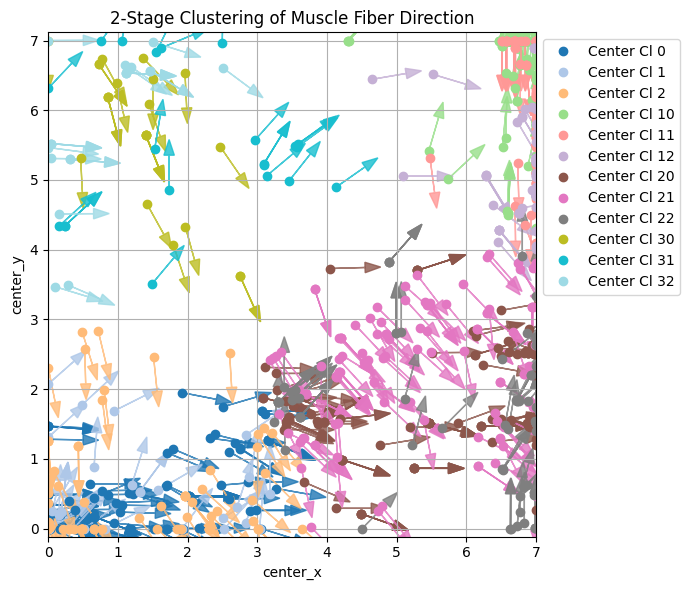

In [25]:
emg_data_session1 = filtered_emg_FD_session1
features_session1 = get_centers_directions(emg_data_session1, window_size=50, threshold=0)
results_df_session1, summary_df_session1 = clustering(features_session1)
summary_df_session1
plot_fiber(results_df_session1)
virtual_bipolars_session1, labels_session1, center_direction_session1, n_virtual_bipolars_session1 = get_virtual_bipolars(results_df_session1)
virtual_emg_session1 = get_virtual_emg(emg_data_session1, virtual_bipolars_session1)
X_session1, y_session1 = get_features(virtual_emg_session1, labels_session1)

In [16]:
summary_df_session1

,cluster,center_x_mean,center_x_std,center_y_mean,center_y_std,theta_deg_mean,theta_deg_std,count
0,0,5.646943,1.229951,0.940980,0.851299,-73.564912,16.155850,14
1,1,4.896573,0.670037,0.762029,0.777889,70.063968,19.335590,18
2,2,5.664377,1.265852,0.548066,1.092759,-2.737701,15.327538,26
3,10,0.156271,0.310457,0.240048,0.534265,52.363906,12.713131,107
4,11,0.423330,0.424788,0.408167,0.627024,-53.157946,20.657773,50
5,12,0.281492,0.413821,0.235038,0.486817,12.639763,11.781344,196
6,20,2.390439,1.340040,4.381913,1.071542,58.462809,21.906058,46
7,21,2.948888,1.167173,3.793571,0.928530,-82.332147,11.692042,46
8,22,2.536257,1.629225,4.757233,1.539894,-18.892597,19.469370,20
9,30,2.165125,0.721925,0.248735,0.531442,63.777193,18.874557,103


検出されたピーク数（条件を満たすもの）: 670


C:\Users\takeu\AppData\Local\Temp\ipykernel_8356\175111030.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, n_clusters)  # 'tab20', 'nipy_spectral', etc.


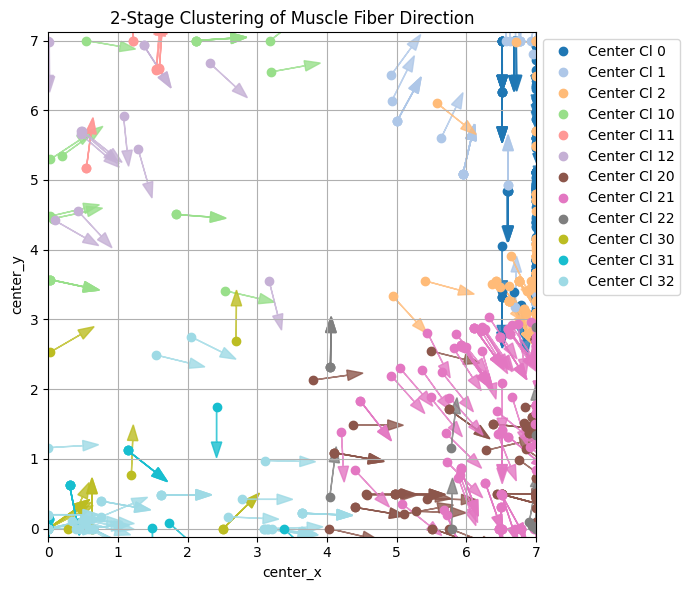

In [26]:
emg_data_session2 = filtered_emg_FD_session2
features_session2 = get_centers_directions(emg_data_session2, window_size=50, threshold=0)
results_df_session2, summary_df_session2 = clustering(features_session2)
summary_df_session2
plot_fiber(results_df_session2)
virtual_bipolars_session2, labels_session2, center_direction_session2, n_virtual_bipolars_session2 = get_virtual_bipolars(results_df_session2)
virtual_emg_session2 = get_virtual_emg(emg_data_session2, virtual_bipolars_session2)
X_session2, y_session2 = get_features(virtual_emg_session2, labels_session2)

In [18]:
summary_df_session2

,cluster,center_x_mean,center_x_std,center_y_mean,center_y_std,theta_deg_mean,theta_deg_std,count
0,0,1.447208,0.991705,5.278212,0.657737,76.620041,15.680070,27
1,1,1.604446,0.865024,5.080408,1.280769,-63.869229,15.876059,21
2,2,1.078674,1.051168,5.109679,0.862641,6.724072,12.356571,32
3,10,1.895657,1.036626,0.110035,0.265006,72.148228,18.112539,127
4,11,2.079713,0.818067,0.316744,0.506814,-68.850123,14.605474,181
5,12,1.428540,1.009777,0.345043,0.467455,-19.350123,18.120650,140
6,20,4.538659,0.935528,3.424193,1.794956,-13.465207,19.750113,35
7,21,5.006030,1.134785,3.454777,1.646872,-73.352762,13.262744,23
8,22,5.839313,1.143316,4.003052,1.759573,56.987477,20.948718,30
9,30,0.768018,0.754108,2.191350,0.927227,-11.281539,19.728473,51


In [27]:
if n_virtual_bipolars_session1 >= 1 and n_virtual_bipolars_session2 >= 1:
    result, y_train, y_test = SVC_classifier(X_session1, y_session1, X_session2, y_session2)
    diff = diff_analyzer(result, y_train, y_test, center_direction_session1, center_direction_session2)
else:
    diff = [None]

In [28]:
diff

[None]

In [321]:
n_virtual_bipolars_session2

0

In [338]:
diffs

[{'diff': [{'train': 0,
    'test': 30,
    'x_diff': 3.8259491881339103,
    'y_diff': 3.593425777750928,
    'theta_diff': 132.32900987559782},
   {'train': 30,
    'test': 10,
    'x_diff': -0.02485568984674824,
    'y_diff': -0.05747863767190342,
    'theta_diff': 9.093665741959128}],
  'file_name': ['pr_dataset/subject01_session1/maintenance_preprocess_sample1',
   'pr_dataset/subject01_session2/maintenance_preprocess_sample1'],
  'electrode_place': 'ED'},
 {'diff': [{'train': 20,
    'test': 21,
    'x_diff': 3.9834823697861856,
    'y_diff': 2.5134437058997183,
    'theta_diff': -8.075040434084851},
   {'train': 30,
    'test': 31,
    'x_diff': 0.7655725323054208,
    'y_diff': 0.15258456651748098,
    'theta_diff': -6.914685794504898},
   {'train': 32,
    'test': 11,
    'x_diff': 3.10617847342346,
    'y_diff': 1.6273900614522736,
    'theta_diff': 14.760163601038961}],
  'file_name': ['pr_dataset/subject01_session1/maintenance_preprocess_sample1',
   'pr_dataset/subject01_s